<a href="https://colab.research.google.com/github/Terry-Migwi/Airbnb_Price_Prediction/blob/main/Airbnb_Price_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Defining the question

### Specifying the data analytic question
The objective of this study is to perform price prediction for Airbnb listings in the city of Paris using statistical and Machine Learning techniques with the following aims:  

1.   Explore linear relationships between variables for price prediction using linear models.
2.   Find complex patterns between the variables using non-linear models and ensemble techniques.

### Defining the metrics for success
This study will be considered successful if the following aims are met :

1. Apply linear regression and machine learning regression techniques, namely, Random Forests, Support Vector Machines, XGBoost, and Neural Networks to predict Airbnb prices.
2. Identify the factors that influence the prices of Airbnb listings.
3. Conduct Feature Importance and Feature Selection using the models with the best performance.
4. Use Root Mean Squared Error (RMSE) and R- Squared (R2) statistical measures to perform model evaluation.
5. Compare the performance of the regression techniques on this particular dataset.
  


### Problem Statement

Since 2007, Airbnb has been a leading platform in providing accommodation for travelers worldwide. As of June 2023, Airbnb operates in over 191 countries and  100,000 cities and towns globally, with about 7 Million listings and 4 Million hosts on the Airbnb platform, Airbnb Newsroom (2023). The price of an Airbnb reservation is solely based on the price set by the host. Determining the price point of an Airbnb listing is usually a complex challenge for hosts because they have to consider various factors such as the location, property characteristics, demand based on seasonality, and events. These factors leave the hosts quite uncertain about the actual price of the houses. As a result, Airbnb hosts resort to using two popular strategies, the smart pricing strategy and the manual pricing strategy, to price their listings, Lamba, G. (2023). The smart pricing strategy is an in-built pricing algorithm the Airbnb platform provides to estimate house prices based on various parameters. However, many hosts have found this strategy misleading and inadequate, Dirk250Laarne et al. (2019). Consequently, the hosts resolve to the manual pricing strategy that involves exploring the market and researching to find out rates in the locality. Hence most hosts resolve to set their listings prices based on houses with similar listings.

The disadvantage of these pricing methods is that they are generic and need to consider that each Airbnb listing is unique in that all listings are unique. There could be two listings in the same complex but with a completely different interior offering different features and amenities. These methods used to price listings easily result in overpriced or underpriced properties, hence a need to be more efficient. It is, therefore, more efficient to customize the price of each Airbnb listing carefully, considering the unique features of that particular listing. Using predictive analytics techniques to predict the prices of Airbnb listings could overcome the collective assumptions made while setting prices and lead to more accuracy of prices.


### Recording the experimental design

The following steps will be followed for the study:

1. Importing libraries and loading data from [airbnb website](https://insideairbnb.com/get-the-data)
2. Checking the data
3. Conducting necessary data cleaning procedures
4. Performing Exploratory Data Analysis
5. Performing data pre-processing
5. Checking necesary model assumptions
6. Building regression models aimed to complete this study
7. Assessing/ Evaluating the model
8. Making a conclusion on the study

## Reading the data

In [ ]:
# import necessary libraries for data manipulation
import pandas as pd
import numpy as np
import scipy

# for visualizations
import matplotlib.pyplot as plt
import seaborn as sns


In [ ]:
# load the dataset

paris_detailed_df = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/paris_detailed.csv')

# what is the shape of the df
paris_detailed_df.shape

(61706, 75)

## Checking the data

In [ ]:
# preview the head of the dataset
paris_detailed_df.head(3)

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,host_url,host_name,host_since,host_location,host_about,host_response_time,host_response_rate,host_acceptance_rate,host_is_superhost,host_thumbnail_url,host_picture_url,host_neighbourhood,host_listings_count,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood,neighbourhood_cleansed,neighbourhood_group_cleansed,latitude,longitude,property_type,room_type,accommodates,bathrooms,bathrooms_text,bedrooms,beds,amenities,price,minimum_nights,maximum_nights,minimum_minimum_nights,maximum_minimum_nights,minimum_maximum_nights,maximum_maximum_nights,minimum_nights_avg_ntm,maximum_nights_avg_ntm,calendar_updated,has_availability,availability_30,availability_60,availability_90,availability_365,calendar_last_scraped,number_of_reviews,number_of_reviews_ltm,number_of_reviews_l30d,first_review,last_review,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,153674,https://www.airbnb.com/rooms/153674,20230606220143,2023-06-07,city scrape,Rental unit in Paris · ★4.44 · 1 bedroom · 3 b...,"Ideally located in the heart of Paris, in a li...","Staying in the 10th arrondissement, between th...",https://a0.muscache.com/pictures/prohost-api/H...,739021,https://www.airbnb.com/users/show/739021,Catherine,2011-06-24,"Paris, France",Après des années à voyager pour mon travail da...,within an hour,100%,100%,f,https://a0.muscache.com/im/pictures/user/a7025...,https://a0.muscache.com/im/pictures/user/a7025...,Gare du Nord - Gare de I'Est,1.0,3.0,"['email', 'phone']",t,t,"Paris, Île-de-France, France",Entrepôt,NaN,48.88303,2.366308,Entire rental unit,Entire home/apt,4,NaN,1 bath,1.0,3.0,"[""Essentials"", ""Hot water kettle"", ""Refrigerat...",$106.00,2,1125,2.0,2.0,30.0,1125.0,2.0,35.0,NaN,t,0,16,34,301,2023-06-07,252,19,0,2011-07-02,2023-05-02,4.44,4.68,4.47,4.68,4.71,4.42,4.47,7511000063553,t,1,1,0,0,1.73
1,33114,https://www.airbnb.com/rooms/33114,20230606220143,2023-06-08,previous scrape,Rental unit in Paris · ★4.60 · 1 bedroom · 1 b...,"A beautifully restored 1-bedroom, 1-bath apart...",The Latin Quarter is one of the oldest distric...,https://a0.muscache.com/pictures/238829/9a7d51...,143558,https://www.airbnb.com/users/show/143558,Axel,2010-06-13,"Salt Lake City, UT",I have lived in 3 countries and traveled to 20...,a few days or more,33%,0%,f,https://a0.muscache.com/im/pictures/user/62319...,https://a0.muscache.com/im/pictures/user/62319...,Panthéon,2.0,2.0,"['email', 'phone', 'work_email']",t,t,"Paris, Île-de-France, France",Panthéon,NaN,48.83936,2.358490,Entire rental unit,Entire home/apt,2,NaN,1 bath,1.0,1.0,"[""TV with standard cable"", ""Essentials"", ""Fire...",$88.00,100,365,100.0,100.0,365.0,365.0,100.0,365.0,NaN,t,0,0,0,66,2023-06-08,70,0,0,2011-09-16,2019-05-20,4.60,4.74,4.33,4.83,4.83,4.83,4.74,7510501191068,f,1,1,0,0,0.49
2,5396,https://www.airbnb.com/rooms/5396,20230606220143,2023-06-08,previous scrape,Rental unit in Paris · ★4.55 · Studio · 1 bed ...,"Cozy, well-appointed and graciously designed s...","You are within walking distance to the Louvre,...",https://a0.muscache.com/pictures/52413/f9bf76f...,7903,https://www.airbnb.com/users/show/7903,Borzou,2009-02-14,"İstanbul, Turkey",The flat is owned by journalists who spend a l...,within an hour,100%,99%,f,https://a0.muscache.com/im/users/7903/profile_...,https://a0.muscache.com/im/users/7903/profile_...,Saint-Paul - Ile Saint-Louis,1.0,1.0,"['email', 'phone']",t,t,"Paris, Ile-de-France, France",Hôtel-de-Ville,NaN,48.85247,2.358350,Entire rental unit,Entire home/apt,2,NaN,1 bath,NaN,1.0,"[""TV with standard cable"", ""Shower g

In [ ]:
# prints out all the attributes
paris_detailed_df.columns

Index(['id', 'listing_url', 'scrape_id', 'last_scraped', 'source', 'name',
       'description', 'neighborhood_overview', 'picture_url', 'host_id',
       'host_url', 'host_name', 'host_since', 'host_location', 'host_about',
       'host_response_time', 'host_response_rate', 'host_acceptance_rate',
       'host_is_superhost', 'host_thumbnail_url', 'host_picture_url',
       'host_neighbourhood', 'host_listings_count',
       'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified', 'neighbourhood',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed', 'latitude',
       'longitude', 'property_type', 'room_type', 'accommodates', 'bathrooms',
       'bathrooms_text', 'bedrooms', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'minimum_minimum_nights',
       'maximum_minimum_nights', 'minimum_maximum_nights',
       'maximum_maximum_nights', 'minimum_nights_avg_ntm',
       'maximum_nights_avg_ntm', 'ca

In [ ]:
# check data types
paris_detailed_df.dtypes

id                                                int64
listing_url                                      object
scrape_id                                         int64
last_scraped                                     object
source                                           object
name                                             object
description                                      object
neighborhood_overview                            object
picture_url                                      object
host_id                                           int64
host_url                                         object
host_name                                        object
host_since                                       object
host_location                                    object
host_about                                       object
host_response_time                               object
host_response_rate                               object
host_acceptance_rate                            

In [ ]:
# explore the last scraped column
# first convert it to datetime dtype
paris_detailed_df['last_scraped'] = pd.to_datetime(paris_detailed_df['last_scraped'])

In [ ]:
# display max and min scraped days
display(paris_detailed_df.last_scraped.max())

display(paris_detailed_df.last_scraped.min())

Timestamp('2023-06-10 00:00:00')

Timestamp('2023-06-07 00:00:00')

In [ ]:
# explore calendar last scraped column
paris_detailed_df['calendar_last_scraped'] = pd.to_datetime(paris_detailed_df['calendar_last_scraped'])

In [ ]:
# display max and min days
display(paris_detailed_df.calendar_last_scraped.max())

display(paris_detailed_df.calendar_last_scraped.min())

Timestamp('2023-06-10 00:00:00')

Timestamp('2023-06-07 00:00:00')

According to the dates provided, the data is for a period of three days in June 2023.

In [ ]:
# explore calendar updated column to obtain any null values

paris_detailed_df['calendar_updated'].isnull().sum()

61706

## Conduct data cleaning procedures

In [ ]:
# drop columns that are irrelevant for this analysis
paris_detailed_df = paris_detailed_df.drop(['id', 'listing_url', 'scrape_id', 'last_scraped', 'source','description', 'neighborhood_overview',
                      'picture_url', 'host_id', 'host_url', 'host_name', 'host_since', 'host_location', 'host_about',
                      'host_response_time', 'host_thumbnail_url', 'host_picture_url', 'host_neighbourhood', 'host_listings_count',
                      'neighbourhood', 'minimum_minimum_nights', 'maximum_minimum_nights', 'minimum_maximum_nights',
                      'maximum_maximum_nights','minimum_nights_avg_ntm','maximum_nights_avg_ntm', 'calendar_updated', 'calendar_last_scraped',
                      'number_of_reviews_ltm', 'number_of_reviews_l30d', 'first_review', 'last_review', 'license'], axis = 1
 )

In [ ]:
# check missing values in all the columns
pd.set_option("display.max_rows", None)

# pd.set_option("display.max_rows", 7)


paris_detailed_df.isnull().sum()

name                                                0
host_response_rate                              25737
host_acceptance_rate                            22157
host_is_superhost                                5441
host_total_listings_count                          18
host_verifications                                  0
host_has_profile_pic                               18
host_identity_verified                             18
neighbourhood_cleansed                              0
neighbourhood_group_cleansed                    61706
latitude                                            0
longitude                                           0
property_type                                       0
room_type                                           0
accommodates                                        0
bathrooms                                       61706
bathrooms_text                                     99
bedrooms                                        14813
beds                        

In [ ]:
# drop columns with more than 1000 missing records

paris_detailed_df = paris_detailed_df.drop(['host_response_rate', 'host_acceptance_rate', 'host_is_superhost', 'neighbourhood_group_cleansed',
                                          'bathrooms', 'bedrooms', 'review_scores_rating', 'review_scores_accuracy',
                                         'review_scores_cleanliness', 'review_scores_checkin', 'review_scores_communication',
                                          'review_scores_location', 'review_scores_value', 'reviews_per_month', 'property_type'], axis = 1)
paris_detailed_df.isnull().sum()

name                                              0
host_total_listings_count                        18
host_verifications                                0
host_has_profile_pic                             18
host_identity_verified                           18
neighbourhood_cleansed                            0
latitude                                          0
longitude                                         0
room_type                                         0
accommodates                                      0
bathrooms_text                                   99
beds                                            728
amenities                                         0
price                                             0
minimum_nights                                    0
maximum_nights                                    0
has_availability                                  0
availability_30                                   0
availability_60                                   0
availability

In [ ]:
# drop the 18 rows with missing data in host_listings_count, host_has_profile_pic, host_identity_verified,
# 99 rows with missing data in bathrooms text and 728rows with missing data in beds.

paris_detailed_df = paris_detailed_df.dropna(axis = 0, inplace = False)

# check if there are any more missing data
paris_detailed_df.isnull().sum()

name                                            0
host_total_listings_count                       0
host_verifications                              0
host_has_profile_pic                            0
host_identity_verified                          0
neighbourhood_cleansed                          0
latitude                                        0
longitude                                       0
room_type                                       0
accommodates                                    0
bathrooms_text                                  0
beds                                            0
amenities                                       0
price                                           0
minimum_nights                                  0
maximum_nights                                  0
has_availability                                0
availability_30                                 0
availability_60                                 0
availability_90                                 0


In [ ]:
# what is the size of the new df

paris_detailed_df.shape

(60892, 27)

## Exploratory Data Analysis

Initial exploration is done using` pandas-profiling `library that will give an overview of all the columns in the data.

In [ ]:
# installing pandas profiling

!pip install -U pandas-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 6.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 353.0/353.0 kB 28.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 12.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 31.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 27.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 455.4/455.4 kB 35.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 74.3 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27079 sha256=cc53ff101ee4d5417bd0685e40fcb59cf6b00496268f8e25da91aa701460f7e1
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: wordcloud
    Found existing installation: wordcloud 1.8.2.2
    Uninstalling wordc

In [ ]:
# import pandas profiling
import pandas_profiling as pp
import warnings
warnings.filterwarnings("ignore")

<ipython-input-29-1997c619a3e9>:2: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  import pandas_profiling as pp


In [ ]:
# generate a report of the columns uisng pandas profiling
from pandas_profiling import ProfileReport
ProfileReport(paris_detailed_df, title = "Paris Airbnb data report")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### **General Observations from this initial exploration**

1. The price column is the target variable and it is of categorical data type. Hence, it should be convereted to numerical data type for regression.  
2. The independent variables are grouped into different categories for data understanding.

* **Room size**: accommodates, bathrooms, bedrooms, beds, room type

There are 4 distinct room types namely, entire home, Private room, Hotel room, and Shared rooms. Most listings in this dataset are listed as entire homes.

The houses listed can accommodate upto 17 people, with most of the houses accommodating 2 people.

* **Host details**: host name, host location, host about, host response time and rate, host listings count, host has profile pic, host identity verified

* **Location details**: neighborhood, latitude, longitude, neighborhood overview

The dataset features 20 different neighborhoods inside the city of Paris.

The latitude and longitude columns are normally distributed.

* **Reviews scores**: reviews, number of reviews, reviews scores ratings, reviews scores location

*   **Booking details**: instant bookable, minimum nights, maximum nights, license, has availability, availability_30, availability_60, availability_90, availability_365

The columns showing the availability of the listings namely, **availability_30, availability_60, availability_90, availability_365** are highly correlated. Hence, it would be redundant to include all of them in the modeling.

*   **Facilities**: Amenities, property type


## Data Pre-processing

In this section, variables with inappropriate data types are pre-processed with the correct data types.

### Pre-process host verifications column

In [ ]:
# split host_verifications column
# # new data frame with split value columns
host_verifications = paris_detailed_df["host_verifications"].str.split(",", n = -1, expand = True)

# preview
host_verifications.head()

,0,1,2
0,['email','phone'],None
1,['email','phone','work_email']
2,['email','phone'],None
3,['email','phone','work_email']
4,['email','phone'],None


### Pre-process amenities column

In [ ]:
# split amenities column
# # new data frame with split value columns
amenities = paris_detailed_df["amenities"].str.split(",", n = -1, expand = True)

# preview
amenities.head()

,0,1,2,3,4,5,6,7,8,9,...,100,101,102,103,104,105,106,107,108,109
0,"[""Essentials""","""Hot water kettle""","""Refrigerator""","""Radiant heating""","""Toaster""","""Smoke alarm""","""Cooking basics""","""Coffee maker""","""Crib""","""Hair dryer""",...,None,None,None,None,None,None,None,None,None,None
1,"[""TV with standard cable""","""Essentials""","""Fire extinguisher""","""Iron""","""Hair dryer""","""Dishes and silverware""","""Paid parking off premises""","""Wifi""","""Long term stays allowed""","""Kitchen""",...,None,None,None,None,None,None,None,None,None,None
2,"[""TV with standard cable""","""Shower gel""","""Essentials""","""Fire extinguisher""","""Clothing storage: closet""","""Hot water kettle""","""Refrigerator""","""Extra pillows and blankets""","""Toaster""","""Smoke alarm""",...,None,None,None,None,None,None,None,None,None,None
3,"[""Essentials""","""Private entrance""","""Refrigerator""","""Extra pillows and blankets""","""Free washer \u2013 In unit""","""Smoke alarm""","""Host greets you""","""HDTV with standard cable""","""Cooking basics""","""Coffee maker""",...,None,None,None,None,None,None,None,None,None,None
4,"[""TV with standard cable""","""Essentials""","""Refrigerator""","""Extra pillows and blankets""","""Free washer \u2013 In unit""","""Smoke alarm""","""Host greets you""","""Cooking basics""","""Coffee maker""","""Microwave""",...,None,None,None,None,None,None,None,None,None,None


In [ ]:
# preview

pd.set_option('display.max_columns', None)
paris_detailed_df.head()

,name,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,room_type,accommodates,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms
0,Rental unit in Paris · ★4.44 · 1 bedroom · 3 b...,3.0,"['email', 'phone']",t,t,Entrepôt,48.88303,2.366308,Entire home/apt,4,"[""Essentials"", ""Hot water kettle"", ""Refrigerat...",$106.00,2,1125,t,0,16,34,301,252,t,1,1,0,0
1,Rental unit in Paris · ★4.60 · 1 bedroom · 1 b...,2.0,"['email', 'phone', 'work_email']",t,t,Panthéon,48.83936,2.358490,Entire home/apt,2,"[""TV with standard cable"", ""Essentials"", ""Fire...",$88.00,100,365,t,0,0,0,66,70,f,1,1,0,0
2,Rental unit in Paris · ★4.55 · Studio · 1 bed ...,1.0,"['email', 'phone']",t,t,Hôtel-de-Ville,48.85247,2.358350,Entire home/apt,2,"[""TV with standard cable"", ""Shower gel"", ""Esse...",$117.00,15,1125,t,1,13,43,223,340,f,1,1,0,0
3,Rental unit in Paris · ★4.62 · 1 bedroom · 1 b...,2.0,"['email', 'phone', 'work_email']",t,t,Buttes-Chaumont,48.87417,2.385810,Entire home/apt,2,"[""Essentials"", ""Private entrance"", ""Refrigerat...",$99.00,5,21,t,4,5,8,52,49,f,1,1,0,0
4,Rental unit in Paris · ★4.72 · 2 bedrooms · 2 ...,9.0,"['email', 'phone']",t,t,Hôtel-de-Ville,48.85909,2.353150,Entire home/apt,4,"[""TV with standard cable"", ""Essentials"", ""Refr...",$130.00,10,130,t,0,15,24,226,333,f,2,2,0,0


### Pre-process Bathrooms Text

In [ ]:
# number of unique values in the column
paris_detailed_df['bathrooms_text'].nunique()

31

In [ ]:
# print the unique values

paris_detailed_df['bathrooms_text'].unique()

array(['1 bath', '1.5 baths', '1 shared bath', '1 private bath',
       '2 baths', '2.5 baths', '4.5 baths', '2 shared baths',
       '1.5 shared baths', '4 baths', 'Half-bath', '3 baths', '0 baths',
       '3.5 baths', 'Private half-bath', 'Shared half-bath',
       '0 shared baths', '5 baths', '2.5 shared baths', '6 baths',
       '8 baths', '3 shared baths', '7 baths', '50 baths',
       '6 shared baths', '5.5 baths', '6.5 baths', '26 baths',
       '7.5 baths', '4 shared baths', '4.5 shared baths'], dtype=object)

There are houses that have extreemly high number of baths. i.e 26, 50, and 75 number of bathrooms are too many for one house.

In [ ]:
# further investigate houses with upto 75 number of baths
pd.set_option('display.max_columns', None)
paris_detailed_df[paris_detailed_df['bathrooms_text'] == '75']

,name,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,room_type,accommodates,bathrooms_text,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,shared_private_bathroom
50566,Rental unit in Paris · 7 bedrooms · 12 beds · ...,1.0,['phone'],t,t,Ménilmontant,48.86508,2.38566,Entire home/apt,16,75,12.0,"[""Essentials"", ""Fire extinguisher"", ""Clothing ...",$690.00,2,365,t,0,0,0,0,0,t,1,1,0,0,private_bathroom


In [ ]:
# Feature engineer baths column into either shared baths or private baths
# create a list of conditions
conditions = [
    paris_detailed_df['bathrooms_text'].str.contains(pat = 'shared', case = False),
    paris_detailed_df['bathrooms_text'].str.contains('shared') == False

]
# create a list of the values we want to assign for each condition
values = ['shared bathroom', 'private bathroom']

# df['hotel_group'] = np.select(conditions, values, default = np.nan)
paris_detailed_df['bathroom_type'] = np.select(conditions, values)

In [ ]:
# counts the results of the created column
paris_detailed_df['bathroom_type'].value_counts()

private bathroom    57332
shared bathroom      3560
Name: bathroom_type, dtype: int64

In [ ]:
# replace 26 baths with 2 baths
paris_detailed_df['bathrooms_text'] = paris_detailed_df['bathrooms_text'].replace(to_replace = '26 baths', value = 2)

In [ ]:
# replace half-bath with 0.5baths
# paris_detailed_df['bathrooms_text'].replace(to_replace = '26 baths', value = 2)

paris_detailed_df = paris_detailed_df.replace({'bathrooms_text' : {'Half-bath' : '0.5', 'Private half-bath' : '0.5', 'Shared half-bath' : '0.5'}})


In [ ]:
# obtain the unique number of bathroom sin the column
paris_detailed_df['bathrooms_text'].unique()

array(['1 bath', '1.5 baths', '1 shared bath', '1 private bath',
       '2 baths', '2.5 baths', '4.5 baths', '2 shared baths',
       '1.5 shared baths', '4 baths', '0.5', '3 baths', '0 baths',
       '3.5 baths', '0 shared baths', '5 baths', '2.5 shared baths',
       '6 baths', '8 baths', '3 shared baths', '7 baths', '50 baths',
       '6 shared baths', '5.5 baths', '6.5 baths', 2, '7.5 baths',
       '4 shared baths', '4.5 shared baths'], dtype=object)

In [ ]:
# remove special characters from the bathrooms column
# paris_detailed_df['bathrooms_text'].str.match('bath', case = False)

paris_detailed_df['bathrooms_text'] = paris_detailed_df['bathrooms_text'].str.replace('bath', '', regex=True)
paris_detailed_df['bathrooms_text'] = paris_detailed_df['bathrooms_text'].str.replace('baths', '', regex=True)
paris_detailed_df['bathrooms_text'] = paris_detailed_df['bathrooms_text'].str.replace('shared bath', '', regex=True)
paris_detailed_df['bathrooms_text'] = paris_detailed_df['bathrooms_text'].str.replace('shared baths', '', regex=True)
paris_detailed_df['bathrooms_text'] = paris_detailed_df['bathrooms_text'].str.replace('private baths', '', regex=True)
paris_detailed_df['bathrooms_text'] = paris_detailed_df['bathrooms_text'].str.replace('private bath', '', regex=True)
paris_detailed_df['bathrooms_text'] = paris_detailed_df['bathrooms_text'].str.replace('private', '', regex=True)
paris_detailed_df['bathrooms_text'] = paris_detailed_df['bathrooms_text'].str.replace('shared', '', regex=True)
paris_detailed_df['bathrooms_text'] = paris_detailed_df['bathrooms_text'].str.replace('s', '', regex=True)



paris_detailed_df['bathrooms_text'].head()

0    1 
1    1 
2    1 
3    1 
4    1 
Name: bathrooms_text, dtype: object

In [ ]:
#
paris_detailed_df['bathrooms_text'].unique()

array(['1 ', '1.5 ', '1  ', '2 ', '2.5 ', '4.5 ', '2  ', '1.5  ', '4 ',
       '0.5', '3 ', '0 ', '3.5 ', '0  ', '5 ', '2.5  ', '6 ', '8 ', '3  ',
       '7 ', '50 ', '6  ', '5.5 ', '6.5 ', '7.5 ', '4  ', '4.5  '],
      dtype=object)

In [ ]:
# convert bathrooms_text to numerical datatype

# relevant_columns['price'] = relevant_columns ['price'].apply(pd.to_numeric)

paris_detailed_df['bathrooms_text'] = paris_detailed_df ['bathrooms_text'].astype('float')

paris_detailed_df['bathrooms_text'].dtypes

dtype('float64')

### Pre-process Beds column

In [ ]:
# what is the data type of the beds column
paris_detailed_df['beds'].dtype

dtype('float64')

In [ ]:
# obtain unique features
paris_detailed_df['beds'].unique()

array([ 3.,  1.,  2.,  4.,  8.,  6.,  5.,  9.,  7., 11., 13., 17., 18.,
       10., 12., 79., 77., 83., 85., 90., 39.])

There are houses with more than 20 beds that seem like extreme values.

In [ ]:
# investigate extreme values in the beds column
paris_detailed_df[paris_detailed_df['beds'] >= 20]

,name,host_total_listings_count,host_verifications,host_has_profile_pic,host_identity_verified,neighbourhood_cleansed,latitude,longitude,room_type,accommodates,bathrooms_text,beds,amenities,price,minimum_nights,maximum_nights,has_availability,availability_30,availability_60,availability_90,availability_365,number_of_reviews,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,shared_private_bathroom
16838,Boutique hotel in Paris · ★4.57 · 50 bedrooms ...,43.0,"['email', 'phone']",t,t,Luxembourg,48.853580,2.336800,Private room,16,50,79.0,"[""Shower gel"", ""Essentials"", ""Fire extinguishe...",$541.00,1,400,t,8,33,58,319,171,f,42,0,24,0,private bathroom
17425,Boutique hotel in Paris · ★4.48 · 50 bedrooms ...,43.0,"['email', 'phone']",t,t,Luxembourg,48.853580,2.336800,Private room,16,50,77.0,"[""Shower gel"", ""Essentials"", ""Fire extinguishe...",$470.00,1,400,t,5,30,55,316,163,f,42,0,24,0,private bathroom
17629,Boutique hotel in Paris · ★4.61 · 50 bedrooms ...,43.0,"['email', 'phone']",t,t,Luxembourg,48.853580,2.336800,Private room,16,50,83.0,"[""Shower gel"", ""Essentials"", ""Fire extinguishe...",$470.00,1,400,t,14,39,64,325,114,f,42,0,24,0,private bathroom
17666,Boutique hotel in Paris · ★4.60 · 50 bedrooms ...,43.0,"['email', 'phone']",t,t,Luxembourg,48.853580,2.336800,Private room,16,50,85.0,"[""Shower gel"", ""Essentials"", ""Fire extinguishe...",$457.00,1,400,t,3,28,53,312,172,f,42,0,24,0,private bathroom
17706,Boutique hotel in Paris · ★4.57 · 50 bedrooms ...,43.0,"['email', 'phone']",t,t,Luxembourg,48.853580,2.336800,Private room,16,50,90.0,"[""Shower gel"", ""Essentials"", ""Fire extinguishe...",$470.00,1,400,t,4,29,54,315,142,f,42,0,24,0,private bathroom
57193,Home in Paris · ★New · 1 bedroom · 39 beds · 1...,29.0,"['email', 'phone']",t,t,Batignolles-Monceau,48.885275,2.294953,Entire home/apt,2,1,39.0,"[""Outdoor dining area"", ""Fire extinguisher"", ""...",$55.00,30,90,t,0,0,22,22,0,f,6,5,1,0,private bathroom
58327,Home in Paris · ★New · 1 bedroom · 39 beds · 1...,29.0,"['email', 'phone']",t,t,Batignolles-Monceau,48.884246,2.293086,Entire home/apt,2,1,39.0,"[""Outdoor dining area"", ""Fire extinguisher"", ""...",$55.00,30,90,t,3,29,54,54,0,f,6,5,1,0,private bathroom
58343,Condo in Paris · ★New · 1 bedroom · 39 beds · ...,29.0,"['email', 'phone']",t,t,Batignolles-Monceau,48.885316,2.294936,Entire home/apt,2,1,39.0,"[""Outdoor dining area"", ""Fire extinguisher"", ""...",$55.00,30,90,t,0,7,37,282,0,f,6,5,1,0,private bathroom
58352,Rental unit in Paris · ★New · 1 bedroom · 39 b...,29.0,"['email', 'phone']",t,t,Batignolles-Monceau,48.883817,2.294645,Private room,2,1,39.0,"[""Outdoor dining area"", ""Fire extinguisher"", ""...",$55.00,30,365,t,26,56,86,361,0,f,6,5,1,0,private bathroom
58458,Home in Paris · ★New · 1 bedroom · 39 beds · 1...,29.0,"['email', 'phone']",t,t,Batignolles-Monceau,48.885780,2.294946,Entire home/apt,2,1,39.0,"[""Outdoor dining area"", ""Fire extinguisher"", ""...",$55.00,30,90,t,0,0,13,156,0,f,6,5,1,0,private bathroom


**General Observations**

1. All listings with 39 beds are small houses, with 1 bathroom and can only accommodate 2 people. Hence, having this number of beds in such a house is most likely a mistake.

2. All listings with more than 40 beds have more than 50 number of beds and can accommodate upto 16 guests. Thi number of beds and bathrooms is still very strange for this kind of houses.

In [ ]:
# replace the records with 39 beds with 1 bed because it's peculiar. A one bedroom house having 39 beds is most likely a mistake.

paris_detailed_df['beds'] = paris_detailed_df['beds'].replace(to_replace = 39, value = 1.0)

In [ ]:
paris_detailed_df['beds'].unique()

array([ 3.,  1.,  2.,  4.,  8.,  6.,  5.,  9.,  7., 11., 13., 17., 18.,
       10., 12., 79., 77., 83., 85., 90.])

### The Price Column / Target Variable

#### Pre-process the Price Column

The price column is the target variable that should be in numerical format. It is however in categorical format hence it will be pre-processed in three steps.
1. Remove special characters in the column.
2. Convert to integer data type.
3. Remove outlier values

In [ ]:
# remove sprecial characters from the price column
paris_detailed_df['price'] = paris_detailed_df['price'].str.replace('\W', '', regex=True)
paris_detailed_df['price'].head()

0    10600
1     8800
2    11700
3     9900
4    13000
Name: price, dtype: object

In [ ]:
# convert price to numerical datatype

# relevant_columns['price'] = relevant_columns ['price'].apply(pd.to_numeric)

paris_detailed_df['price'] = paris_detailed_df ['price'].astype('int')

paris_detailed_df['price'].dtypes

dtype('int64')

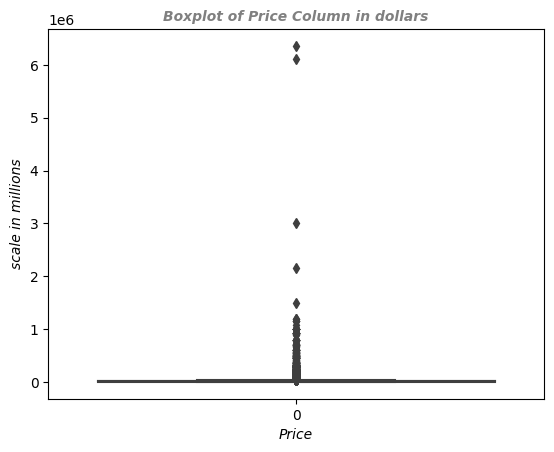

In [ ]:
# boxplot of the price column to check for any outliers

chart = sns.boxplot(paris_detailed_df['price'])
chart.set_title("Boxplot of Price Column in dollars", fontdict={'size': 10, 'style':'oblique', 'weight': 'heavy', 'color': 'grey'})
chart.set_xlabel("Price", fontdict={'size': 10, 'style':'oblique', 'weight': 'light', 'color': 'black'})
chart.set_ylabel("scale in millions", fontdict={'size': 10, 'style':'oblique', 'weight': 'light', 'color': 'black'})

# chart = sns.countplot(x='Day', data = df, palette = 'Blues', order = ['Wednesday', 'Thursday', 'Monday', 'Friday', 'Saturday', 'Tuesday', 'Sunday'])

plt.show()

#### Descriptive Statistics of the Price column



In [ ]:
# maximum price
paris_detailed_df['price'].max()

6359400

In [ ]:
# minimum price
paris_detailed_df['price'].min()

0

In [ ]:
# mean price
paris_detailed_df['price'].mean()

19801.980358474055

In [ ]:
# median price
paris_detailed_df['price'].median()

12000.0

In [ ]:
# variance
paris_detailed_df['price'].var()

2885417207.325179

In [ ]:
# standard deviation
paris_detailed_df['price'].std()

53716.07959750208

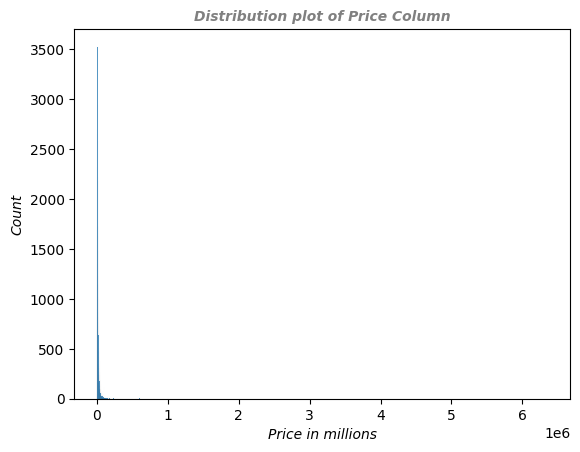

In [ ]:
# plot histogram

chart_2 = sns.histplot(data = paris_detailed_df, x = 'price')

chart_2.set_title("Distribution plot of Price Column", fontdict={'size': 10, 'style':'oblique', 'weight': 'heavy', 'color': 'grey'})
chart_2.set_xlabel("Price in millions", fontdict={'size': 10, 'style':'oblique', 'weight': 'light', 'color': 'black'})
chart_2.set_ylabel("Count", fontdict={'size': 10, 'style':'oblique', 'weight': 'light', 'color': 'black'})

plt.show()

**General Observations from the Price Column**

1. The price column seems to be following an exponetial distribution.
2. The most expensive house is listed at 6,359,400 dollars while the cheapest house is listed at 0 dollars.
3. The mean value of the price column is 19801.980358474055 while the median price is 12000.0. The standard deviation is 53716.079, which is quite high hence an indication that there are values that are too far from the mean.


In [ ]:
# investigate outlier values
paris_detailed_df[paris_detailed_df['price'] >= 1400000]

,id,listing_url,scrape_id,last_scraped,source,name,description,neighborhood_overview,picture_url,host_id,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
7272,7447891,https://www.airbnb.com/rooms/7447891,20230606220143,2023-06-07,city scrape,Condo in Paris · 1 bedroom · 1 bed · 1 bath,Petit appartement T2 entre parque Buttes Chaum...,NaN,https://a0.muscache.com/pictures/6ae15c65-646e...,33264663,...,5.00,5.00,5.00,7511907369879,f,1,1,0,0,0.25
46986,675928818653563593,https://www.airbnb.com/rooms/675928818653563593,20230606220143,2023-06-07,city scrape,Rental unit in Paris · ★4.94 · Studio · 1 bed ...,studio dans le 15e arrondissement de Paris.<br...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,463373000,...,4.94,4.88,4.69,Exempt - hotel-type listing,f,1,1,0,0,2.58
49014,720336382717313551,https://www.airbnb.com/rooms/720336382717313551,20230606220143,2023-06-07,city scrape,Rental unit in Paris · 1 bedroom · 1 bed · 1.5...,L'ensemble du groupe bénéficiera d'un accès fa...,NaN,https://a0.muscache.com/pictures/e330fdc4-ec6b...,480344085,...,NaN,NaN,NaN,NaN,f,1,0,1,0,NaN
55312,832453259349117793,https://www.airbnb.com/rooms/832453259349117793,20230606220143,2023-06-07,city scrape,Rental unit in Paris · 2 bedrooms · 3 beds · 1...,"In the 7th arr. District of Paris, close to Ei...",NaN,https://a0.muscache.com/pictures/prohost-api/H...,474928665,...,NaN,NaN,NaN,7510706408822,t,12,12,0,0,NaN
56231,849049656897709453,https://www.airbnb.com/rooms/849049656897709453,20230606220143,2023-06-07,city scrape,Rental unit in Paris · 1 bedroom · 1 bed · 1 bath,Appartement de 35m2 avec une chambre dans le 1...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,477231990,...,NaN,NaN,NaN,"Available with a mobility lease only (""bail mo...",f,1,1,0,0,NaN


In [ ]:
# given the statistics of the price column described above, listings that are 1,400,000 dollars and above are dropped.

paris_detailed_df.drop(paris_detailed_df[paris_detailed_df['price'] >= 1400000].index, inplace = True)

<Axes: >

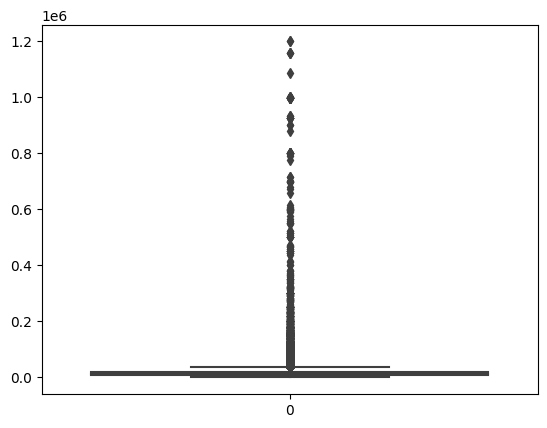

In [ ]:
# boxplot after dropping extreme values
sns.boxplot(paris_detailed_df['price'])

<Axes: xlabel='price', ylabel='Count'>

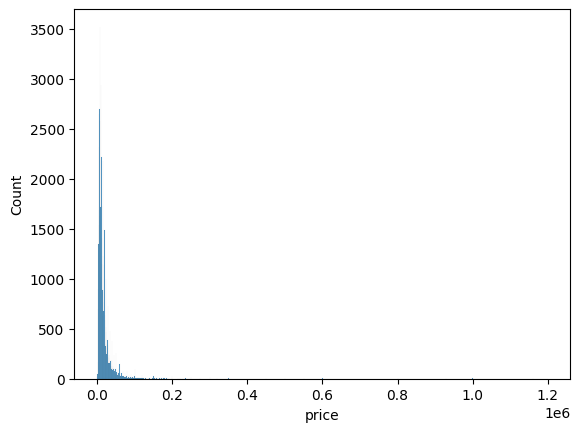

In [ ]:
# plot histogram

sns.histplot(data = relevant_columns, x = 'price')

In [ ]:
# drop records that have been listed with 0 dollars. It would not make sense to keep these because technically, those houses are listed free of charge

paris_detailed_df.drop(paris_detailed_df[paris_detailed_df['price'] == 0].index, inplace = True)

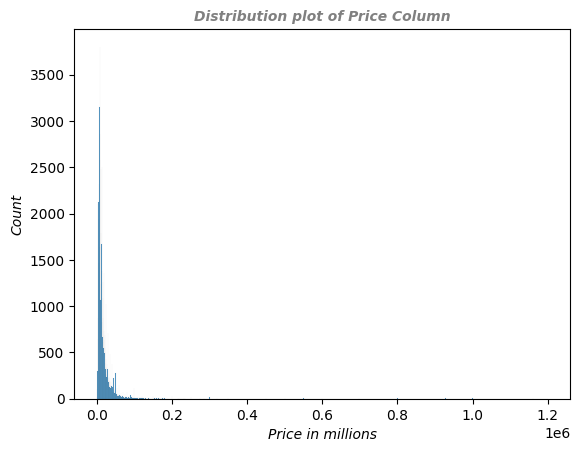

In [ ]:
# plot histogram

chart_3 = sns.histplot(data = paris_detailed_df, x = 'price')

chart_3.set_title("Distribution plot of Price Column", fontdict={'size': 10, 'style':'oblique', 'weight': 'heavy', 'color': 'grey'})
chart_3.set_xlabel("Price in millions", fontdict={'size': 10, 'style':'oblique', 'weight': 'light', 'color': 'black'})
chart_3.set_ylabel("Count", fontdict={'size': 10, 'style':'oblique', 'weight': 'light', 'color': 'black'})

plt.show()

In [ ]:
# skewness and kurtosis of the price variable

print(scipy.stats.skew(paris_detailed_df['price'], axis=0, bias=True))


15.275934702880562


In [ ]:
# kurtosis of the price variable
print(scipy.stats.kurtosis(paris_detailed_df['price'], axis = 0, bias = True))

338.57085321427456


After dropping the extreme values from the price column, the variable is highly skewed to the right.

In [ ]:
# the new size of the data
paris_detailed_df.shape

(61675, 75)

### Convert columns to appropriate data types

In [ ]:
# to convert to categorical

columns = [['host_has_profile_pic', 'host_identity_verified', 'neighbourhood_cleansed', 'room_type', 'has_availability', 'instant_bookable']]

for cols in columns:
  relevant_columns[cols] = relevant_columns[cols].astype('category')

relevant_columns.dtypes

<ipython-input-26-6acbf568a4c7>:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  relevant_columns[cols] = relevant_columns[cols].astype('category')


host_total_listings_count                        float64
host_has_profile_pic                            category
host_identity_verified                          category
neighbourhood_cleansed                          category
latitude                                         float64
longitude                                        float64
room_type                                       category
accommodates                                       int64
price                                              int64
minimum_nights                                     int64
maximum_nights                                     int64
has_availability                                category
number_of_reviews                                  int64
instant_bookable                                category
calculated_host_listings_count                     int64
calculated_host_listings_count_entire_homes        int64
calculated_host_listings_count_private_rooms       int64
calculated_host_listings_count_

In [ ]:
paris_detailed_df.columns

Index(['name', 'host_total_listings_count', 'host_verifications',
       'host_has_profile_pic', 'host_identity_verified',
       'neighbourhood_cleansed', 'latitude', 'longitude', 'room_type',
       'accommodates', 'bathrooms_text', 'beds', 'amenities', 'price',
       'minimum_nights', 'maximum_nights', 'has_availability',
       'availability_30', 'availability_60', 'availability_90',
       'availability_365', 'number_of_reviews', 'instant_bookable',
       'calculated_host_listings_count',
       'calculated_host_listings_count_entire_homes',
       'calculated_host_listings_count_private_rooms',
       'calculated_host_listings_count_shared_rooms', 'bathroom_type'],
      dtype='object')

## Initial Variable Selection

The initial variable selection depended on how relevant the features were for the analysis. Hence, variables like id, host_id, scrape_id, source, name, and description were eliminated because they would introduce noise into the models. Variables whose majority of the data had the same values, such as minimum minimum nights, minimum maximum nights, number of reviews ltm, first review, and last review, were eliminated, and variables that had plenty of missing values, such as host details, bathrooms, bedrooms, and reviews scores details hence were also eliminated.

In [ ]:
# define the relevant columns to use for analysis

relevant_columns = paris_detailed_df[['host_total_listings_count', 'host_has_profile_pic', 'host_identity_verified', 'neighbourhood_cleansed', 'latitude', 'longitude', 'room_type',
                 'accommodates', 'price', 'minimum_nights', 'maximum_nights', 'has_availability', 'number_of_reviews', 'instant_bookable',
                  'calculated_host_listings_count','calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms',
                  'calculated_host_listings_count_shared_rooms', 'bathrooms_text', 'beds', 'bathroom_type']]

# check if they have relevant data types
relevant_columns.dtypes

host_total_listings_count                       float64
host_has_profile_pic                             object
host_identity_verified                           object
neighbourhood_cleansed                           object
latitude                                        float64
longitude                                       float64
room_type                                        object
accommodates                                      int64
price                                             int64
minimum_nights                                    int64
maximum_nights                                    int64
has_availability                                 object
number_of_reviews                                 int64
instant_bookable                                 object
calculated_host_listings_count                    int64
calculated_host_listings_count_entire_homes       int64
calculated_host_listings_count_private_rooms      int64
calculated_host_listings_count_shared_rooms     

In [ ]:
# create dummy variables for the categorical data

one_hot_encoded_data = pd.get_dummies(relevant_columns, columns = ['host_has_profile_pic', 'host_identity_verified', 'neighbourhood_cleansed',
                                                                  'room_type', 'has_availability', 'instant_bookable', 'bathroom_type'], drop_first = True)
one_hot_encoded_data.head()

,host_total_listings_count,latitude,longitude,accommodates,price,minimum_nights,maximum_nights,number_of_reviews,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,bathrooms_text,beds,host_has_profile_pic_t,host_identity_verified_t,neighbourhood_cleansed_Bourse,neighbourhood_cleansed_Buttes-Chaumont,neighbourhood_cleansed_Buttes-Montmartre,neighbourhood_cleansed_Entrepôt,neighbourhood_cleansed_Gobelins,neighbourhood_cleansed_Hôtel-de-Ville,neighbourhood_cleansed_Louvre,neighbourhood_cleansed_Luxembourg,neighbourhood_cleansed_Ménilmontant,neighbourhood_cleansed_Observatoire,neighbourhood_cleansed_Opéra,neighbourhood_cleansed_Palais-Bourbon,neighbourhood_cleansed_Panthéon,neighbourhood_cleansed_Passy,neighbourhood_cleansed_Popincourt,neighbourhood_cleansed_Reuilly,neighbourhood_cleansed_Temple,neighbourhood_cleansed_Vaugirard,neighbourhood_cleansed_Élysée,room_type_Hotel room,room_type_Private room,room_type_Shared room,has_availability_t,instant_bookable_t,bathroom_type_shared bathroom
0,3.0,48.88303,2.366308,4,10600,2,1125,252,1,1,0,0,1.0,3.0,1,1,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0
1,2.0,48.83936,2.358490,2,8800,100,365,70,1,1,0,0,1.0,1.0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0
2,1.0,48.85247,2.358350,2,11700,15,1125,340,1,1,0,0,1.0,1.0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
3,2.0,48.87417,2.385810,2,9900,5,21,49,1,1,0,0,1.0,1.0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
4,9.0,48.85909,2.353150,4,13000,10,130,333,2,2,0,0,1.0,2.0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0


In [ ]:
one_hot_encoded_data.dtypes

host_total_listings_count                       float64
latitude                                        float64
longitude                                       float64
accommodates                                      int64
price                                             int64
minimum_nights                                    int64
maximum_nights                                    int64
number_of_reviews                                 int64
calculated_host_listings_count                    int64
calculated_host_listings_count_entire_homes       int64
calculated_host_listings_count_private_rooms      int64
calculated_host_listings_count_shared_rooms       int64
bathrooms_text                                  float64
beds                                            float64
host_has_profile_pic_t                            uint8
host_identity_verified_t                          uint8
neighbourhood_cleansed_Bourse                     uint8
neighbourhood_cleansed_Buttes-Chaumont          

In [ ]:
# export the cleaned data into a csv file

one_hot_encoded_data.to_csv('recent_paris_cleaned.csv')

## Cleaned data

After the data pre-processing, the cleaned data is all in `numerical format` and with `no missing data`, and `no extreme values`.

In [ ]:
# import clean dataset
df = pd.read_csv("/content/recent_paris_cleaned.csv", index_col = 'Unnamed: 0')

In [ ]:
# preview
df.head()

,host_total_listings_count,latitude,longitude,accommodates,price,minimum_nights,maximum_nights,number_of_reviews,calculated_host_listings_count,calculated_host_listings_count_entire_homes,...,neighbourhood_cleansed_Reuilly,neighbourhood_cleansed_Temple,neighbourhood_cleansed_Vaugirard,neighbourhood_cleansed_Élysée,room_type_Hotel room,room_type_Private room,room_type_Shared room,has_availability_t,instant_bookable_t,bathroom_type_shared bathroom
0,3.0,48.88303,2.366308,4,10600,2,1125,252,1,1,...,0,0,0,0,0,0,0,1,1,0
1,2.0,48.83936,2.358490,2,8800,100,365,70,1,1,...,0,0,0,0,0,0,0,1,0,0
2,1.0,48.85247,2.358350,2,11700,15,1125,340,1,1,...,0,0,0,0,0,0,0,1,0,0
3,2.0,48.87417,2.385810,2,9900,5,21,49,1,1,...,0,0,0,0,0,0,0,1,0,0
4,9.0,48.85909,2.353150,4,13000,10,130,333,2,2,...,0,0,0,0,0,0,0,1,0,0


In [ ]:
# check for mull values
df.isnull().sum()

host_total_listings_count                       0
latitude                                        0
longitude                                       0
accommodates                                    0
price                                           0
minimum_nights                                  0
maximum_nights                                  0
number_of_reviews                               0
calculated_host_listings_count                  0
calculated_host_listings_count_entire_homes     0
calculated_host_listings_count_private_rooms    0
calculated_host_listings_count_shared_rooms     0
bathrooms_text                                  0
beds                                            0
host_has_profile_pic_t                          0
host_identity_verified_t                        0
neighbourhood_cleansed_Bourse                   0
neighbourhood_cleansed_Buttes-Chaumont          0
neighbourhood_cleansed_Buttes-Montmartre        0
neighbourhood_cleansed_Entrepôt                 0


### Investigate the Price column

<Axes: xlabel='price', ylabel='Count'>

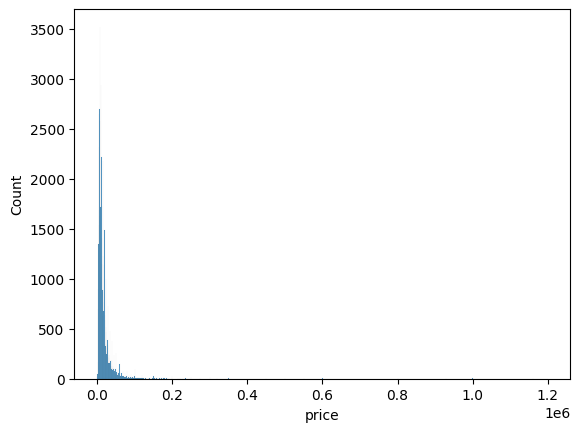

In [ ]:
# plot histogram

sns.histplot(data = df, x = 'price')

In [ ]:
# investigate outlier values
df[df['price'] == 0]

,host_total_listings_count,latitude,longitude,accommodates,price,minimum_nights,maximum_nights,number_of_reviews,calculated_host_listings_count,calculated_host_listings_count_entire_homes,...,neighbourhood_cleansed_Reuilly,neighbourhood_cleansed_Temple,neighbourhood_cleansed_Vaugirard,neighbourhood_cleansed_Élysée,room_type_Hotel room,room_type_Private room,room_type_Shared room,has_availability_t,instant_bookable_t,bathroom_type_shared bathroom


In [ ]:
# obtain measures of central tendency
print(df['price'].max())
print(df['price'].min())
print(df['price'].mean())

1200000
800
19385.38251814867


In [ ]:
# drop records with price value of 0

df.drop(df[df['price'] == 0].index, inplace = True)

In [ ]:
# check the new shape of the df

df.shape

(60886, 41)

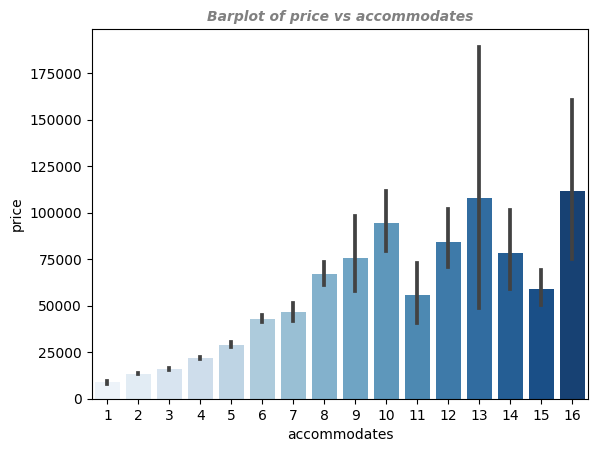

In [ ]:
# price vs accommodates
# plot a chart to show the frequency of hotel group
chart_1 = sns.barplot(data=df, y="price", x= "accommodates", palette="Blues")

chart_1.set_title("Barplot of price vs accommodates", fontdict={'size': 10, 'style':'oblique', 'weight': 'heavy', 'color': 'grey'})

plt.show()

### Correlations

<Axes: >

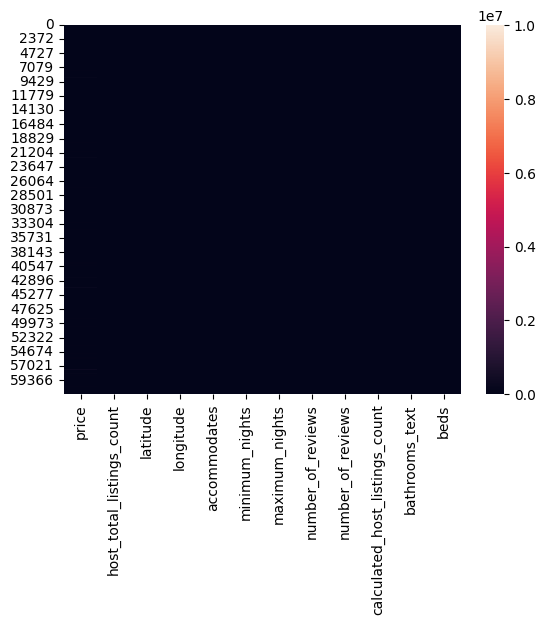

In [ ]:
# numerical columns
numerical_columns = df[['price', 'host_total_listings_count', 'latitude', 'longitude', 'accommodates', 'minimum_nights',
                        'maximum_nights', 'number_of_reviews','number_of_reviews', 'calculated_host_listings_count', 'bathrooms_text', 'beds']]

# heatmap
sns.heatmap(numerical_columns)


In [ ]:
# correlation plot

numerical_columns = df[['price', 'host_total_listings_count', 'latitude', 'longitude', 'accommodates', 'minimum_nights',
                        'maximum_nights', 'number_of_reviews','number_of_reviews', 'calculated_host_listings_count', 'bathrooms_text', 'beds']]

# sns.pairplot(numerical_columns, corner = True)

In [ ]:
type(numerical_columns)

pandas.core.frame.DataFrame

## Statistical Techniques

### Linear Regression

Linear regression is a statistical technique used to determine correlations between variables and use these relations to make predictions. Multiple linear regression predicts the relationship between one dependent variable and more than one independent variable. Uyanık, G.K. and Güler, N. (2013). Linear regression minimizes the sum of squared errors between the predicted values and the dependent variable’s actual values, hence, finding a line of best fit for making predictions.
Multiple linear regression is computed using the formula below:

          `y = 𝛃0 +𝛃1X1 + ... +𝛃n Xn + 𝜀 `                                                                          
where;

```*   y is the dependent variable, i.e. the variable that is being predicted.
*   𝛃0 is the constant term
*   𝛃1...𝛃n are the coefficients
*   X1….Xn are the independent variables i.e. the predictor variables
*   𝜀  is the error term i.e. residuals.
```




In [ ]:

# import relevant libraries for linear regression

from sklearn.preprocessing import StandardScaler
from sklearn import preprocessing
from sklearn.linear_model import LinearRegression
from sklearn import linear_model

from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import mean_squared_error, r2_score

from sklearn.model_selection import GridSearchCV

In [ ]:
# separate dependent and independent variables
# obtain df with only relevant independent variables
independent_df = df.drop(['price'], axis =1)

**Assumptions of Linear Regression**

A linear regression model should meet certain conditions to be considered valid, Poole, M.A. and O'Farrell, P.N. (1971). Hence, the multiple linear regression model will tests the following assumptions:

1. Linearity - A linear relationship exists between the dependent and the independent variables.
2. Normality - The error terms follow a normal distribution.
3. Homoscedasticity of the error terms; that is, the error terms are assumed to have a constant variance.
4. Independence of the error terms; i.e., the errors are assumed to be statistically independent.
5. Multicollinearity - the independent variables are linearly independent, ensuring no information redundancy in the model.  


#### Multi-collinearity


In [ ]:
# determine correlations between the variables
correlations = independent_df.corr()
correlations

,host_total_listings_count,latitude,longitude,accommodates,minimum_nights,maximum_nights,number_of_reviews,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,host_has_profile_pic_t,host_identity_verified_t,neighbourhood_cleansed_Bourse,neighbourhood_cleansed_Buttes-Chaumont,neighbourhood_cleansed_Buttes-Montmartre,neighbourhood_cleansed_Entrepôt,neighbourhood_cleansed_Gobelins,neighbourhood_cleansed_Hôtel-de-Ville,neighbourhood_cleansed_Louvre,neighbourhood_cleansed_Luxembourg,neighbourhood_cleansed_Ménilmontant,neighbourhood_cleansed_Observatoire,neighbourhood_cleansed_Opéra,neighbourhood_cleansed_Palais-Bourbon,neighbourhood_cleansed_Panthéon,neighbourhood_cleansed_Passy,neighbourhood_cleansed_Popincourt,neighbourhood_cleansed_Reuilly,neighbourhood_cleansed_Temple,neighbourhood_cleansed_Vaugirard,neighbourhood_cleansed_Élysée,room_type_Hotel room,room_type_Private room,room_type_Shared room,has_availability_t,instant_bookable_t
host_total_listings_count,1.000000,-0.012793,-0.051019,0.052180,-0.088095,-0.000054,-0.030424,0.681291,0.676677,0.078722,-0.009206,0.030703,-0.010159,0.022629,-0.024302,-0.037667,-0.015669,-0.013365,0.033119,0.015160,0.017427,-0.026432,-0.014982,0.009653,0.030320,-0.000149,0.031788,-0.021838,-0.009547,0.027586,-0.009377,0.040999,-0.018623,-0.057297,-0.015461,0.021126,0.105920
latitude,-0.012793,1.000000,0.085562,-0.015600,0.007394,0.007622,-0.025875,-0.010295,-0.005608,-0.035615,0.027729,0.014064,0.011299,0.036197,0.255119,0.487602,0.159345,-0.359704,-0.085372,-0.010625,-0.132700,0.006937,-0.356225,0.173421,-0.075634,-0.197723,-0.075267,-0.073956,-0.230675,-0.010236,-0.339984,0.097379,-0.008591,-0.024750,0.001630,-0.003688,-0.022696
longitude,-0.051019,0.085562,1.000000,-0.030961,-0.005096,-0.000486,0.007480,-0.083344,-0.080294,-0.022725,0.032834,0.014439,0.005567,0.011350,0.276759,-0.004728,0.132596,0.073916,0.075269,-0.016563,-0.055439,0.379687,-0.109210,-0.035818,-0.166154,0.026573,-0.484858,0.320449,0.279072,0.097629,-0.410074,-0.173295,-0.057174,0.015121,0.011687,0.006656,-0.069027
accommodates,0.052180,-0.015600,-0.030961,1.000000,-0.026751,-0.004525,0.041270,0.058241,0.070982,-0.082890,-0.023843,0.008003,0.060490,0.065397,-0.006608,-0.052110,0.002892,-0.004851,0.015042,0.022810,0.001355,-0.027683,-0.011059,-0.001666,0.008623,0.001542,0.025027,-0.023268,-0.005161,0.033059,-0.012767,0.051796,-0.051099,-0.224356,-0.063502,0.000175,0.048348
minimum_nights,-0.088095,0.007394,-0.005096,-0.026751,1.000000,0.003523,-0.164241,-0.086683,-0.081137,-0.038642,-0.028231,0.041963,-0.250989,-0.034457,0.002049,0.020914,-0.008778,0.005356,-0.023108,-0.028749,-0.013845,0.008363,0.007661,-0.004525,-0.003845,-0.010045,0.005626,0.014131,0.009189,-0.021928,0.016483,-0.022684,-0.036733,-0.179954,-0.035452,0.025993,-0.061120
maximum_nights,-0.000054,0.007622,-0.000486,-0.004525,0.003523,1.000000,-0.001992,0.000468,0.000522,-0.000374,-0.000234,0.001391,-0.012252,-0.000458,-0.001189,0.011257,-0.001201,-0.000872,-0.000735,-0.000628,-0.000648,-0.001224,-0.000903,-0.000707,-0.000578,-0.000780,-0.000907,-0.001390,-0.000905,-0.000737,-0.001161,-0.000371,0.000504,0.010010,-0.000494,0.001247,-0.001949
number_of_reviews,-0.030424,-0.025875,0.007480,0.041270,-0.164241,-0.001992,1.000000,-0.048001,-0.047840,-0.012734,0.018853,0.038560,0.101069,0.061711,-0.033772,-0.028657,0.011099,-0.008831,0.030088,0.036269,0.017031,-0.033069,-0.003355,0.015192,0.012709,0.021720,-0.032448,0.000133,-0.002667,0.041353,-0.004912,-0.001754,0.042807,0.054036,0.021781,0.047121,0.033821
calculated_host_listings_count,0.681291,-0.010295,-0.083344,0.058241,-0.086683,0.000468,-0.048001,1.000000,0.989851,0.139284,-0.007194,0.033901,0.075111,0.048446,-0.039968,-0.053016,-0.028259,-0.021508,0.041154,0.028053,0.026391,-0.042810,-0.022344,0.019382,0.035783,-0.000673,0.041344,-0.035395,-0.022285,0.039736,-0.015070,0.080139,-0.017143,-0.063396,-0.01635

In [ ]:
# computing VIF scores for each variable
pd.DataFrame(np.linalg.inv(correlations.values), index = correlations.index, columns = correlations.columns)

,host_total_listings_count,latitude,longitude,accommodates,minimum_nights,maximum_nights,number_of_reviews,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,host_has_profile_pic_t,host_identity_verified_t,neighbourhood_cleansed_Bourse,neighbourhood_cleansed_Buttes-Chaumont,neighbourhood_cleansed_Buttes-Montmartre,neighbourhood_cleansed_Entrepôt,neighbourhood_cleansed_Gobelins,neighbourhood_cleansed_Hôtel-de-Ville,neighbourhood_cleansed_Louvre,neighbourhood_cleansed_Luxembourg,neighbourhood_cleansed_Ménilmontant,neighbourhood_cleansed_Observatoire,neighbourhood_cleansed_Opéra,neighbourhood_cleansed_Palais-Bourbon,neighbourhood_cleansed_Panthéon,neighbourhood_cleansed_Passy,neighbourhood_cleansed_Popincourt,neighbourhood_cleansed_Reuilly,neighbourhood_cleansed_Temple,neighbourhood_cleansed_Vaugirard,neighbourhood_cleansed_Élysée,room_type_Hotel room,room_type_Private room,room_type_Shared room,has_availability_t,instant_bookable_t
host_total_listings_count,1.913224,-0.014168,-0.019478,-0.007682,0.099268,0.001290,-0.004069,-1.763756,0.456232,0.100715,0.011438,-0.023187,0.144258,0.024884,-0.007199,-0.003824,-0.009199,-0.009863,-0.008858,0.009935,-0.003619,-0.008219,-0.013318,0.007484,-0.014046,-0.004600,-0.018966,-0.010047,-0.017010,0.000537,-0.021111,0.026121,0.051723,0.057383,0.011747,-0.002759,-0.148241
latitude,-0.014168,11.338449,-0.197560,0.015564,-0.002437,-0.022607,-0.026296,0.289214,-0.257361,0.025067,-0.103334,0.022747,-0.021372,2.157247,0.484543,-0.617992,1.865923,6.416643,3.419697,2.175012,3.756745,3.132237,6.448102,1.101188,3.051162,4.618245,3.841823,4.736292,5.246529,2.988560,7.092204,1.306826,-0.025020,0.003903,0.017258,0.029029,0.017016
longitude,-0.019478,-0.197560,14.658032,0.060276,-0.012964,0.002337,0.037292,3.429391,-3.263605,-0.447214,-0.009720,-0.000902,0.016813,-3.002101,-7.272946,-4.609756,-5.675467,-3.842844,-3.831745,-2.064503,-1.811817,-8.722288,-1.384716,-2.783109,-0.153337,-3.134556,3.221149,-8.622475,-6.943255,-4.550456,1.502425,-0.222511,0.051507,-0.013185,-0.020584,-0.004632,0.070553
accommodates,-0.007682,0.015564,0.060276,1.095682,0.054880,0.000925,-0.042737,-2.256795,2.213265,0.362687,-0.016297,-0.011028,-0.031461,-0.070597,-0.043568,0.016535,-0.036316,-0.022698,-0.022913,-0.031203,-0.009168,-0.025648,-0.003405,-0.022439,-0.006371,-0.016800,-0.017339,-0.018557,-0.034626,-0.042092,0.009039,-0.060772,0.116493,0.259033,0.095412,0.008727,-0.078188
minimum_nights,0.099268,-0.002437,-0.012964,0.054880,1.164293,-0.002313,0.146969,0.305834,-0.269281,-0.059673,-0.011436,-0.064850,0.283397,0.042657,0.038082,0.037082,0.044238,0.018673,0.038862,0.038404,0.024178,0.035825,0.012835,0.021594,0.019911,0.027771,0.017460,0.032349,0.017256,0.044548,0.014520,0.031571,0.052855,0.242534,0.057500,-0.040066,0.022826
maximum_nights,0.001290,-0.022607,0.002337,0.000925,-0.002313,1.000455,0.000873,0.069837,-0.073141,-0.007871,-0.000103,-0.001288,0.011529,-0.005885,-0.001599,-0.011099,-0.004746,-0.012649,-0.007992,-0.004980,-0.008101,-0.006930,-0.012736,-0.002741,-0.006493,-0.009910,-0.007453,-0.010871,-0.011256,-0.007577,-0.013977,-0.003119,-0.002275,-0.011312,-0.000075,-0.001393,0.002403
number_of_reviews,-0.004069,-0.026296,0.037292,-0.042737,0.146969,0.000873,1.061204,-1.994509,2.056238,0.309208,0.006868,-0.042892,-0.070363,-0.094490,-0.012810,-0.025403,-0.058673,-0.038218,-0.069847,-0.061981,-0.047214,-0.025869,-0.038699,-0.050232,-0.044085,-0.061664,-0.002525,-0.071422,-0.052636,-0.085838,-0.045439,-0.022237,-0.017327,-0.046919,-0.020619,-0.051280,-0.004310
calculated_host_listings_count,-1.763756,0.289214,3.429391,-2.256795,0.305834,0.069837,-1.994509,4378.452526,-4336.004845,-613.504292,-24.175979,-0.100319,1.181856,0.013691,-1.135410,-2.756771,-1.057145,-0.673737,-0.172870,-0.295075,-4.586559,-1.305421,0.532911,-1.639772,-0.191603,-0.316006,1.666286,-1.095072,-0.632228,-1.043223,1.675999,0.817314,-52.0

To check for the correlation of the independent variables, the `Variance Inflation Factor (VIF)` was computed for each independent variable used to fit the linear regression model. The threshold value for the VIF score used was 10. ‌Salmerón, R., García, C.B. and García, J. (2018). The Variables with VIF scores greater than ten included;

**'calculated_host_listings_count_entire_homes', ‘calcuated_host_listings_count_private_rooms’, and ‘calculated_host_listings_count_shared_rooms’**

which were dropped from the modeling. The longitude and latitude variables also had high VIF scores of 14.651 and 11.328, respectively, indicating high multicollinearity between the two variables. However, these variables were both retained because they had location details. Removing either of the variables significantly reduced the accuracy of the model.

In [ ]:
# drop the columns with very high collinearity

df = df.drop(['calculated_host_listings_count_entire_homes', 'calculated_host_listings_count_private_rooms',
            'calculated_host_listings_count_shared_rooms'], axis =1)

#

### Pre-process the data for modeling

In [ ]:
# create dependent and independent variables

X = df[['host_total_listings_count', 'latitude', 'longitude', 'accommodates', 'minimum_nights', 'maximum_nights', 'number_of_reviews',
      'calculated_host_listings_count', 'host_has_profile_pic_t', 'host_identity_verified_t', 'neighbourhood_cleansed_Bourse',
      'neighbourhood_cleansed_Buttes-Chaumont', 'neighbourhood_cleansed_Buttes-Montmartre', 'neighbourhood_cleansed_Entrepôt',
      'neighbourhood_cleansed_Gobelins', 'neighbourhood_cleansed_Hôtel-de-Ville', 'neighbourhood_cleansed_Louvre',
      'neighbourhood_cleansed_Luxembourg', 'neighbourhood_cleansed_Ménilmontant', 'neighbourhood_cleansed_Observatoire',
      'neighbourhood_cleansed_Opéra', 'neighbourhood_cleansed_Palais-Bourbon', 'neighbourhood_cleansed_Panthéon', 'neighbourhood_cleansed_Passy',
      'neighbourhood_cleansed_Popincourt', 'neighbourhood_cleansed_Reuilly', 'neighbourhood_cleansed_Temple', 'neighbourhood_cleansed_Vaugirard',
      'neighbourhood_cleansed_Élysée', 'room_type_Hotel room', 'room_type_Private room', 'room_type_Shared room',
      'has_availability_t', 'instant_bookable_t', 'bathroom_type_shared bathroom', 'bathrooms_text', 'beds']].values

y = df['price'].values.reshape(-1, 1)

In [ ]:
# variables for training the data

train_df = df[['host_total_listings_count', 'latitude', 'longitude', 'accommodates', 'minimum_nights', 'maximum_nights', 'number_of_reviews',
      'calculated_host_listings_count', 'host_has_profile_pic_t', 'host_identity_verified_t', 'neighbourhood_cleansed_Bourse',
      'neighbourhood_cleansed_Buttes-Chaumont', 'neighbourhood_cleansed_Buttes-Montmartre', 'neighbourhood_cleansed_Entrepôt',
      'neighbourhood_cleansed_Gobelins', 'neighbourhood_cleansed_Hôtel-de-Ville', 'neighbourhood_cleansed_Louvre',
      'neighbourhood_cleansed_Luxembourg', 'neighbourhood_cleansed_Ménilmontant', 'neighbourhood_cleansed_Observatoire',
      'neighbourhood_cleansed_Opéra', 'neighbourhood_cleansed_Palais-Bourbon', 'neighbourhood_cleansed_Panthéon', 'neighbourhood_cleansed_Passy',
      'neighbourhood_cleansed_Popincourt', 'neighbourhood_cleansed_Reuilly', 'neighbourhood_cleansed_Temple', 'neighbourhood_cleansed_Vaugirard',
      'neighbourhood_cleansed_Élysée', 'room_type_Hotel room', 'room_type_Private room', 'room_type_Shared room',
      'has_availability_t', 'instant_bookable_t', 'bathroom_type_shared bathroom', 'bathrooms_text', 'beds']]

In [ ]:
X.shape

(60886, 37)

In [ ]:
y.shape

(60886, 1)

### Log transformation

In [ ]:
# perform log transformation on y
y_trans = np.log1p(y)

### Train-Test split

In [ ]:
# split the data into 70%train data and 30% test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state = 0)

In [ ]:
print(X_train.shape, X_test.shape )

(42620, 37) (18266, 37)


### Feature Scaling

The independent variables with a continuous scale were scaled using sk-learn’s standard scaler library. The standard scaler standardizes a feature by subtracting the mean and scaling the unit variance using the formula;

              `z = 𝙭 - 𝞵 / 𝞼 `                                                       

where;     
```
*   𝙭  is the original value that is being standardized
*   𝞵 is the mean of the variable
*   𝞼 is the standard deviation of the variable
```      

In [ ]:
# feature scaling
from sklearn.preprocessing import StandardScaler
# scale x
sc_X = StandardScaler()
X_train_scaled = sc_X.fit_transform(X_train)
X_test_scaled = sc_X.transform(X_test)

In [ ]:
# scale y
sc_y = StandardScaler()
y_train_scaled = sc_y.fit_transform(y_train)
y_test_scaled = sc_y.fit_transform(y_test)


In [ ]:
# importing the Linear Regression
from sklearn.linear_model import LinearRegression

# fitting a linear regression
linear = LinearRegression()
linear.fit(X_train_scaled, y_train_scaled)

# importing mean squared error metric
from sklearn.metrics import mean_squared_error

linear_y_pred = linear.predict(X_test_scaled)

# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test_scaled, linear_y_pred))
# The root mean squared error
print("Root Mean squared error: %.2f" % mean_squared_error(y_test_scaled, linear_y_pred, squared = False))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test_scaled, linear_y_pred))

Mean squared error: 1.00
Root Mean squared error: 1.00
Coefficient of determination: -0.00


## Machine Learning Techniques

### Random Forest

Random forest is a tree-based algorithm that combines multiple decision trees to make predictions. It leverages the` ensemble technique`, which is a technique that creates training subsets from the training data and combines the results of all these subsets for a more robust output. Ensemble techniques usually consider a series of simple models known as weak learners to improve them to become stronger. The Random Forests algorithm trains the weak learners independently from each other and then averages the results of these learners to generate a final output, a technique known as bagging. `Bagging`, therefore, reduces the variance of the algorithm, which is often associated with overfitting.

In [ ]:
# import Random Forest libraries
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score
import math
import sklearn.metrics

In [ ]:
y = df['price'].values.ravel()


In [ ]:
# y transposed
y_trans = np.log1p(y)

In [ ]:
y_trans.shape

(60886,)

In [ ]:
# split the data into 70%train data and 30% test data
X_train, X_test, y_train, y_test = train_test_split(X, y_trans, test_size = 0.3, random_state = 0)

In [ ]:
# random forest regressor before scaling the data
# instantiate random forest regressor
random_regressor = RandomForestRegressor(n_estimators=500)

# train random forest regressor
random_regressor.fit(X_train, y_train)
forest_y_pred = random_regressor.predict(X_test)

# mean_error = sklearn.metrics.mean_squared_error(y_test, forest_y_pred)

# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, forest_y_pred))
# The root mean squared error
print("Root Mean squared error: %.2f" % mean_squared_error(y_test, forest_y_pred, squared = False))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, forest_y_pred))

Mean squared error: 0.22
Root Mean squared error: 0.47
Coefficient of determination: 0.63


Feature: 0, Score: 0.04101
Feature: 1, Score: 0.11795
Feature: 2, Score: 0.10881
Feature: 3, Score: 0.31217
Feature: 4, Score: 0.12264
Feature: 5, Score: 0.03410
Feature: 6, Score: 0.05702
Feature: 7, Score: 0.09556
Feature: 8, Score: 0.00158
Feature: 9, Score: 0.00752
Feature: 10, Score: 0.00133
Feature: 11, Score: 0.00077
Feature: 12, Score: 0.00136
Feature: 13, Score: 0.00259
Feature: 14, Score: 0.00073
Feature: 15, Score: 0.00137
Feature: 16, Score: 0.00218
Feature: 17, Score: 0.00223
Feature: 18, Score: 0.00086
Feature: 19, Score: 0.00086
Feature: 20, Score: 0.00169
Feature: 21, Score: 0.00185
Feature: 22, Score: 0.00118
Feature: 23, Score: 0.00166
Feature: 24, Score: 0.00193
Feature: 25, Score: 0.00096
Feature: 26, Score: 0.00130
Feature: 27, Score: 0.00175
Feature: 28, Score: 0.00357
Feature: 29, Score: 0.00848
Feature: 30, Score: 0.03690
Feature: 31, Score: 0.00698
Feature: 32, Score: 0.00437
Feature: 33, Score: 0.01475


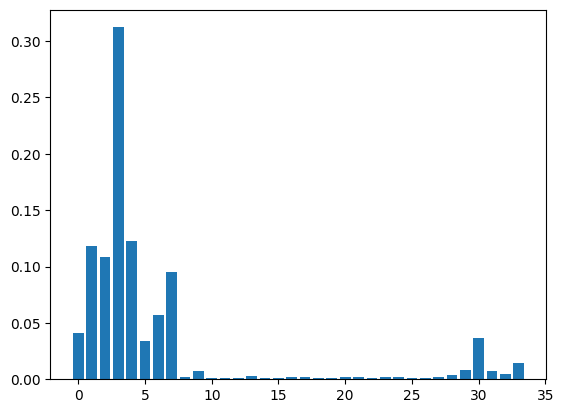

In [ ]:
# getting feature importance

# get importance
importance = random_regressor.feature_importances_
# summarize feature importance
for i,v in enumerate(importance):
 print('Feature: %0d, Score: %.5f' % (i,v))

# plot feature importance
plt.bar([x for x in range(len(importance))], importance)
plt.show()

In [ ]:
# including feature names in the graph

feature_names = [f"feature {i}" for i in range(X.shape[1])]
forest = RandomForestRegressor(random_state=0)
forest.fit(X_train, y_train)

RandomForestRegressor(random_state=0)

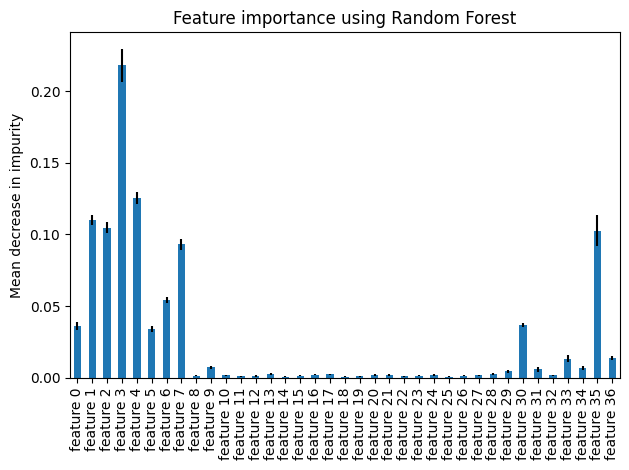

In [ ]:
# feature importances
importances = forest.feature_importances_
std = np.std([tree.feature_importances_ for tree in forest.estimators_], axis=0)


forest_importances = pd.Series(importances, index=feature_names)

fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importance using Random Forest")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()

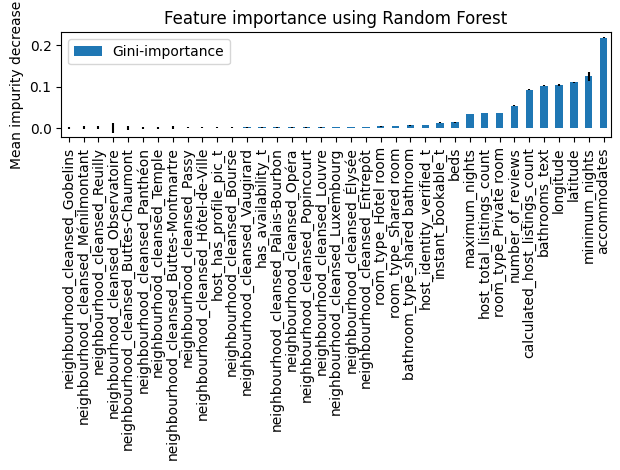

In [ ]:
#do code to support model
#"data" is the X dataframe and model is the SKlearn object

feats = {} # a dict to hold feature_name: feature_importance
for feature, importance in zip(train_df.columns, forest.feature_importances_):
    feats[feature] = importance #add the name/value pair

importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gini-importance'})
# importances.sort_values(by='Gini-importance').plot(kind='bar', rot=45)

# forest_importances = pd.Series(importances, index=feature_names)

fig, ax = plt.subplots()
importances.sort_values(by = 'Gini-importance').plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importance using Random Forest")
ax.set_ylabel("Mean impurity decrease")
fig.tight_layout()

In [ ]:
# randomized search

from sklearn.model_selection import RandomizedSearchCV
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 200, stop = 2000, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 110, num = 11)]
max_depth.append(None)
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4]
# Method of selecting samples for training each tree
bootstrap = [True, False]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf,
               'bootstrap': bootstrap}

In [ ]:
# Use the random grid to search for best hyperparameters
# First create the base model to tune
rf = RandomForestRegressor()
# Random search of parameters, using 3 fold cross validation,
# search across 100 different combinations, and use all available cores
rf_random = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, n_iter = 100, cv = 3, verbose=2, random_state=42, n_jobs = -1)
# Fit the random search model
rf_random.fit(X_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


`RandomizedSearchCV` was used to find the best match of hyperparameters. The hyperparameters tuned are: n_estimators, max_features, max_depth, min_samples_split, min_samples_leaf. and bootstrap.

In [ ]:
rf_random.best_params_

In [ ]:
rf_random_y_pred = rf_random.predict(X_test)

# mean_error = sklearn.metrics.mean_squared_error(y_test, forest_y_pred)

# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, forest_y_pred))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, forest_y_pred))

### Support Vector Machines

SVR is a powerful algorithm for learning patterns in data that are both linear and nonlinear. SVR is, therefore, a powerful algorithm for regression tasks where there may be complex relationships between the input variables and the target variable. SVR finds a line that best separates the data points in a continuous space, usually known as a `hyperplane`. The hyperplane approximates the relationship between the input variables and a continuous target variable while minimizing the prediction error. For data that is not linear, SVR uses a technique known as the `kernel trick`, that implicitly maps the input vectors to a higher dimensional feature space, which adds more dimensions to the inputs, hence re-arranging the dataset in such a way that it can be separated linearly.

SVR was implemented on the dataset using three kernels, the `linear kernel`, `polynomial kernel`, and the `radial basis kernel (RBF)`. Linear kernels fit data that is linearly separable, while polynomial kernels fit data that follows a polynomial pattern. The RBF kernel gives a non-linear regression line that is a polynomial of infinite power and hence, gives a curve that fits complex datasets.

In [ ]:
# flatten the target variable
y = df['price'].values.ravel()


In [ ]:
# perform log transformation on y
y_trans = np.log1p(y)

In [ ]:
from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
sc_y = StandardScaler()
X = sc_X.fit_transform(X)
# y = sc_y.fit_transform(y)

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(X, y_trans, test_size = 0.3, random_state = 0)

#### Linear Kernel

In [ ]:
# fit SVR into the data using linear kernel
from sklearn.svm import SVR
svr_regressor = SVR(kernel = 'linear')
svr_regressor.fit(X_train, y_train)

# make prediction
svr_y_pred = svr_regressor.predict(X_test)

# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, svr_y_pred))
# The root mean squared error
print("Root Mean squared error: %.2f" % mean_squared_error(y_test, svr_y_pred, squared = False))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, svr_y_pred))

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Mean squared error: 7.10
Root Mean squared error: 2.67
Coefficient of determination: -10.69


#### Polynomial Kernel

In [ ]:
# fit SVR into the data using polynomial kernel
from sklearn.svm import SVR
svr_regressor = SVR(kernel = 'poly')
svr_regressor.fit(X_train, y_train)

# make prediction
svr_y_pred = svr_regressor.predict(X_test)

# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, svr_y_pred))
# The root mean squared error
print("Root Mean squared error: %.2f" % mean_squared_error(y_test, svr_y_pred, squared = False))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, svr_y_pred))

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


Mean squared error: 581.23
Root Mean squared error: 24.11
Coefficient of determination: -955.91


In [ ]:
# fit SVR into the data using rbf kernel
from sklearn.svm import SVR
svr_regressor = SVR(kernel = 'rbf')
svr_regressor.fit(X_train, y_train)

# make prediction
svr_y_pred = svr_regressor.predict(X_test)

# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, svr_y_pred))
# The root mean squared error
print("Root Mean squared error: %.2f" % mean_squared_error(y_test, svr_y_pred, squared = False))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, svr_y_pred))

Mean squared error: 0.25
Root Mean squared error: 0.50
Coefficient of determination: 0.59


#### Radial Basis Kernel

In [ ]:
# fit SVR into the data using rbf kernel
from sklearn.svm import SVR
svr_regressor = SVR(kernel = 'rbf')
svr_regressor.fit(X_train, y_train)

# make prediction
svr_y_pred = svr_regressor.predict(X_test)

# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, svr_y_pred))
# The root mean squared error
print("Root Mean squared error: %.2f" % mean_squared_error(y_test, svr_y_pred, squared = False))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, svr_y_pred))

Mean squared error: 0.25
Root Mean squared error: 0.50
Coefficient of determination: 0.59


The linear and polynomial kernels resulted in negative values of the coefficient of determination (R-squared), which means that these models were too simplistic to learn the patterns of this data.

The RBF kernel had R-squared of 0.59 which means it was better off at understanding the patterns of the dataset.

### Gradient Boost Regressor (GBR)

Gradient Boosting is another `tree-boosting algorithm `for machine learning predictions. Similar to the random forest, it is `an ensemble algorithm`, but unlike the random forest, which uses the bagging technique, the `GBM leverages the boosting technique`. The boosting technique trains the weak learners sequentially such that the base model depends on the previous model and then combines them to generate the final output. The GBM minimizes errors of the weaker learners by retraining the incorrect predictions in the next model using the gradient boosting technique. As a result, it produces stronger models that are more complex. Boosting, therefore, reduces the bias of an algorithm. More bias results in a phenomenon known as underfitting.

In [ ]:
# split the data into 70% train data and 30% test data
X_train, X_test, y_train, y_test = train_test_split(X, y_trans, test_size = 0.3, random_state = 0)

In [ ]:
# import libraries for gbm

from sklearn.ensemble import GradientBoostingRegressor
from xgboost import XGBRegressor
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold



In [ ]:
# define the parameters
params = {
    "n_estimators": 500,
    "max_depth": 4,
    "min_samples_split": 5,
    "learning_rate": 0.01,
    "loss": "squared_error",
}


In [ ]:
# fit the model

xgb_reg = GradientBoostingRegressor(**params)
xgb_reg.fit(X_train, y_train)


GradientBoostingRegressor(learning_rate=0.01, max_depth=4, min_samples_split=5,
                          n_estimators=500)

In [ ]:
# make prediction
gbb_y_pred = xgb_reg.predict(X_test)

# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, gbb_y_pred))
# The root mean squared error
print("Root Mean squared error: %.2f" % mean_squared_error(y_test, gbb_y_pred, squared = False))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, gbb_y_pred))

Mean squared error: 0.24
Root Mean squared error: 0.49
Coefficient of determination: 0.60


The GBM gave R-squared of 0.60 and an RMSE score of 0.49.

### XGBoost

`eXtreme Gradient Boosting` is also a boosting algorithm advancing the GBM. The working procedure of the XGBoost is similar to the GBM. The main difference between GBM and XGBoost is that XGBoost uses the `regularization technique` to introduce variance in the algorithm and control overfitting. Hence, it is an exceptional algorithm because it has a good balance of variance and Bias in the algorithm, a phenomenon known as the `Bias-Variance trade-off`.

In [ ]:
# fit the model on the whole dataset
xgb_regressor = XGBRegressor(objective='reg:squarederror')
xgb_regressor.fit(X_train, y_train)

# make prediction
xgb_y_pred = xgb_regressor.predict(X_test)

# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, xgb_y_pred))

# The root mean squared error
print("Root Mean squared error: %.2f" % mean_squared_error(y_test, xgb_y_pred, squared = False))

# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, xgb_y_pred))

Mean squared error: 0.21
Root Mean squared error: 0.46
Coefficient of determination: 0.65


In [ ]:
# fit the model on the whole dataset
xgb_regressor = XGBRegressor(objective='reg:squarederror')
xgb_regressor.fit(X_train, y_train)

# make prediction
xgb_y_pred = xgb_regressor.predict(X_test)

# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, xgb_y_pred))
# The root mean squared error
print("Root Mean squared error: %.2f" % mean_squared_error(y_test, xgb_y_pred, squared = False))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, xgb_y_pred))

Mean squared error: 0.21
Root Mean squared error: 0.46
Coefficient of determination: 0.65


In [ ]:
# use gridsearch to tune hyperparameters

from sklearn.model_selection import KFold, GridSearchCV

# define the search space for gridsearch
search_space = {
    "n_estimators": [100, 300, 500, 700],
    "max_depth": range(4, 7),
    # "min_samples_split": [1, 3, 5, 8],
    "learning_rate": [0.01, 0.05, 0.1, 0.3]
    # "loss": ["squared_error"],
}

# define cross validation
kfold = KFold(n_splits = 10, random_state = 42, shuffle = True)

# define gridsearch
grid = GridSearchCV(
    XGBRegressor(objective='reg:squarederror'),
    param_grid = search_space,
    cv = kfold,
    verbose = 1,
    n_jobs = 1
)

# fit the data into the gridsearch
tuned_gbm = grid.fit(X_train, y_train)

Fitting 10 folds for each of 48 candidates, totalling 480 fits


In [ ]:
# make prediction
tuned_xgb_y_pred = tuned_gbm.predict(X_test)

# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, tuned_xgb_y_pred))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, tuned_xgb_y_pred))

Mean squared error: 0.22
Coefficient of determination: 0.65


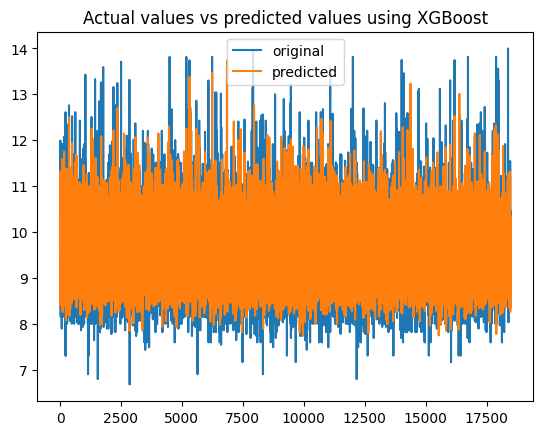

In [ ]:
# visualizing results
x_ax = range(len(y_test))
plt.plot(x_ax, y_test, label="original")
plt.plot(x_ax, xgb_y_pred, label="predicted")
plt.title("Actual values vs predicted values using XGBoost")
plt.legend()
plt.show()

#### XGBoost Importance and Selection

In [ ]:
# print the coefficients of the features based on their importance
print(xgb_regressor.feature_importances_)

[0.01208203 0.01239853 0.01036188 0.19926919 0.06385841 0.01151395
 0.0089976  0.07307707 0.00617643 0.01099157 0.00484911 0.00330908
 0.00360441 0.03116706 0.00249529 0.01077698 0.01859213 0.01400502
 0.02643407 0.00955885 0.00664114 0.00897816 0.00555132 0.01128272
 0.01917364 0.00446254 0.01093641 0.00724246 0.01085892 0.05277795
 0.08221351 0.03254986 0.0059132  0.01732444 0.04383344 0.12601614
 0.02072557]


In [ ]:
# obtaining feature importance
f_importance = xgb_regressor.get_booster().get_score(importance_type='gain')


In [ ]:
# f_importance = xbg_reg.get_booster().get_score(importance_type='gain')
# put that in a df
importance_df = pd.DataFrame.from_dict(data=f_importance,
                                       orient='index')

<Axes: >

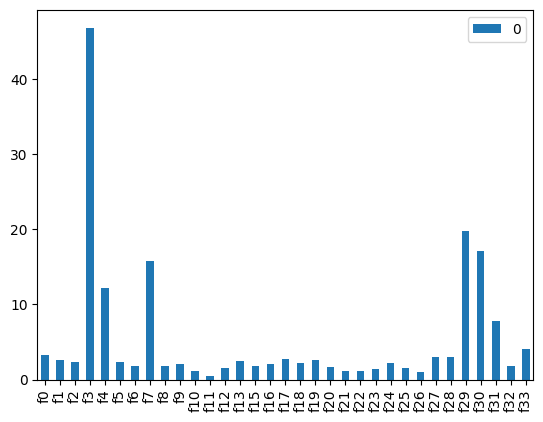

In [ ]:
importance_df.plot.bar()


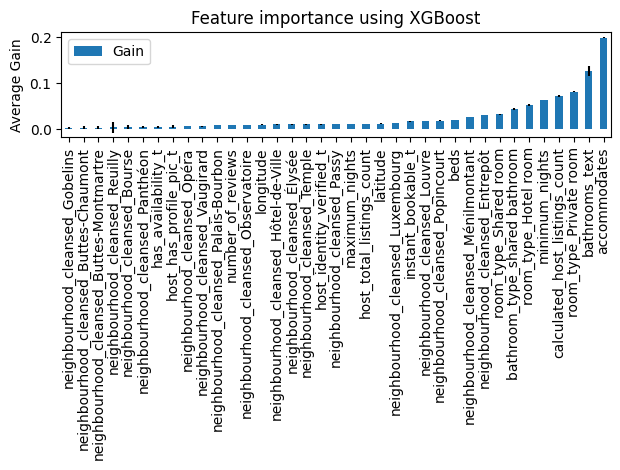

In [ ]:

feats = {} # a dict to hold feature_name: feature_importance
for feature, importance in zip(train_df.columns, xgb_regressor.feature_importances_):
    feats[feature] = importance #add the name/value pair

importances = pd.DataFrame.from_dict(feats, orient='index').rename(columns={0: 'Gain'})
# importances.sort_values(by='Gini-importance').plot(kind='bar', rot=45)

# forest_importances = pd.Series(importances, index=feature_names)

fig, ax = plt.subplots()
importances.sort_values(by = 'Gain').plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importance using XGBoost")
ax.set_ylabel("Average Gain")
fig.tight_layout()

In [ ]:
selected_columns = df[['host_total_listings_count', 'latitude', 'longitude', 'accommodates', 'minimum_nights', 'maximum_nights', 'number_of_reviews',
      'calculated_host_listings_count', 'host_has_profile_pic_t', 'host_identity_verified_t', 'neighbourhood_cleansed_Bourse',
      'neighbourhood_cleansed_Entrepôt',
      'neighbourhood_cleansed_Hôtel-de-Ville', 'neighbourhood_cleansed_Louvre',
      'neighbourhood_cleansed_Luxembourg', 'neighbourhood_cleansed_Ménilmontant', 'neighbourhood_cleansed_Observatoire',
      'neighbourhood_cleansed_Opéra', 'neighbourhood_cleansed_Palais-Bourbon', 'neighbourhood_cleansed_Passy',
      'neighbourhood_cleansed_Popincourt', 'neighbourhood_cleansed_Temple', 'neighbourhood_cleansed_Vaugirard',
      'neighbourhood_cleansed_Élysée', 'room_type_Hotel room', 'room_type_Private room', 'room_type_Shared room',
      'has_availability_t', 'instant_bookable_t', 'bathroom_type_shared bathroom', 'bathrooms_text', 'beds']].values

In [ ]:
# split the data into 70%train data and 30% test data
X_train, X_test, y_train, y_test = train_test_split(selected_columns, y_trans, test_size = 0.3, random_state = 0)

In [ ]:
# fit the model on the whole dataset
xgb_regressor = XGBRegressor(objective='reg:squarederror')
xgb_regressor.fit(X_train, y_train)

# make prediction
xgb_y_pred = xgb_regressor.predict(X_test)

# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, xgb_y_pred))
# The root mean squared error
print("Root Mean squared error: %.2f" % mean_squared_error(y_test, xgb_y_pred, squared = False))
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, xgb_y_pred))

Mean squared error: 0.21
Root Mean squared error: 0.46
Coefficient of determination: 0.65


### Neural Networks

The power of Neural Networks comes from their multi-layered structure, which can learn complex patterns in the training data and relate them to the output variables. The structure of a NN consists of an `input layer`, `hidden layers`, and `an output layer`. The input layer is the bottom layer of the network that takes in the dataset as its input to the network. After the input layer are the hidden layer(s) responsible for learning patterns and capturing any existing trends in the dataset. The final hidden layer is the output layer responsible for outputting a value or a vector of values corresponding to the format required for the problem, in this case, a continuous variable.

The data structure of a NN can learn to represent features at different scales or resolutions and combine them into higher-order features. This technique is made possible by the network architecture with neuron weights and activation functions. Neuron weights are values assigned to the inputs, and they quantify the contribution of the input variable to the output. The weighted inputs are then summed and passed through an activation function, a process known as `activation`. The type of problem that is being modeled is what determines the type of activation function to use. For example, a `linear activation function` is used to predict a linear relationship. In contrast, data that is not linear mostly uses other functions such as `sigmoid`,` RELU`, or` tanH`.


In [ ]:
# log transform y
y_trans = np.log1p(y)

In [ ]:
from sklearn.neural_network import MLPRegressor
from sklearn.preprocessing import StandardScaler


In [ ]:
# split the data into 70%train data and 30% test data
X_train, X_test, y_train, y_test = train_test_split(X, y_trans, test_size = 0.3, random_state = 0)

In [ ]:
# scale the data
sc_X = StandardScaler()
X_trainscaled=sc_X.fit_transform(X_train)
X_testscaled=sc_X.transform(X_test)

#### Tan-H Activation Function

In [ ]:
# build a NN model using tanh activation function
mlp_reg = MLPRegressor(
    hidden_layer_sizes = (100, 64,),
    activation = 'tanh',
    alpha=0.5,
    batch_size = 500,
    learning_rate = 'adaptive',
    learning_rate_init = 0.1,
    random_state = 1,
    max_iter = 2000,
    early_stopping = True,
    validation_fraction = 0.1
)

# fit the model
mlp_reg.fit(X_trainscaled, y_train)

MLPRegressor(activation='tanh', alpha=0.5, batch_size=500, early_stopping=True,
             hidden_layer_sizes=(100, 64), learning_rate='adaptive',
             learning_rate_init=0.1, max_iter=2000, random_state=1)

In [ ]:
# make predictions
mlp_y_pred=mlp_reg.predict(X_testscaled)

# evaluation metrics
# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, mlp_y_pred))
# R-squared
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, mlp_y_pred))

Mean squared error: 0.28
Coefficient of determination: 0.53


In [ ]:
# make predictions
mlp_y_pred=mlp_reg.predict(X_testscaled)

# evaluation metrics
# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, mlp_y_pred))
# The root mean squared error
print("Root Mean squared error: %.2f" % mean_squared_error(y_test, mlp_y_pred, squared = False))
# R-squared
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, mlp_y_pred))

Mean squared error: 0.29
Root Mean squared error: 0.54
Coefficient of determination: 0.53


#### Logistic Activation Function

In [ ]:
# build a NN model using activation function
mlp_reg = MLPRegressor(
    hidden_layer_sizes = (100, 64,),
    activation = 'logistic',
    alpha=0.5,
    batch_size = 500,
    learning_rate = 'adaptive',
    learning_rate_init = 0.1,
    random_state = 1,
    max_iter = 2000,
    early_stopping = True,
    validation_fraction = 0.1
)

# fit the model
mlp_reg.fit(X_trainscaled, y_train)

MLPRegressor(activation='logistic', alpha=0.5, batch_size=500,
             early_stopping=True, hidden_layer_sizes=(100, 64),
             learning_rate='adaptive', learning_rate_init=0.1, max_iter=2000,
             random_state=1)

In [ ]:
# make predictions
mlp_y_pred=mlp_reg.predict(X_testscaled)

# evaluation metrics
# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, mlp_y_pred))
# The root mean squared error
print("Root Mean squared error: %.2f" % mean_squared_error(y_test, mlp_y_pred, squared = False))
# R-squared
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, mlp_y_pred))

Mean squared error: 0.29
Root Mean squared error: 0.54
Coefficient of determination: 0.52


In [ ]:
# scale the data
# sc_y = StandardScaler()
# y_trainscaled=sc_y.fit_transform(y_train)
# y_testscaled=sc_y.transform(y_test)

#### Identity or Linear Activation Function

In [ ]:
# build a NN model
mlp_reg = MLPRegressor(
    hidden_layer_sizes = (100, 64,),
    activation = 'identity',
    alpha=0.001,
    batch_size = 'auto',
    learning_rate = 'adaptive',
    learning_rate_init = 0.1,
    random_state = 1,
    max_iter = 2000,
    early_stopping = True,
    validation_fraction = 0.1
)

# fit the model
mlp_reg.fit(X_trainscaled, y_train)

MLPRegressor(activation='identity', alpha=0.001, early_stopping=True,
             hidden_layer_sizes=(100, 64), learning_rate='adaptive',
             learning_rate_init=0.1, max_iter=2000, random_state=1)

In [ ]:
# make predictions
mlp_y_pred=mlp_reg.predict(X_testscaled)

# evaluation metrics
# The mean squared error
print("Mean squared error: %.2f" % mean_squared_error(y_test, mlp_y_pred))
# The root mean squared error
print("Root Mean squared error: %.2f" % mean_squared_error(y_test, mlp_y_pred, squared = False))

# R-squared
# The coefficient of determination: 1 is perfect prediction
print("Coefficient of determination: %.2f" % r2_score(y_test, mlp_y_pred))

Mean squared error: 0.69
Root Mean squared error: 0.83
Coefficient of determination: -0.14


## Discussion

**Key Results**

Given our research objective to leverage statistical and machine learning techniques to predict the prices of Airbnb listings in the City of Paris, the results demonstrate that machine learning techniques are more robust than statistical techniques in predicting the prices of Airbnb listings. The models implemented in this study include multiple linear regression, support vector regression, multilayer perceptron, random forest regression, gradient boosting machines, and XGBoost. The machine learning techniques produced a notably high performance, with the `XGBoost` having the `highest performance` with an R-squared score of `0.65`, meaning that the model built explains 65% of the variability in house prices. However, the `linear regression`, a more statistical technique, had a relatively low `R-squared score of 0.17` model performance. These results indicate that the data is not linearly separable and that machine learning  techniques are more effective for predicting the price of Airbnb listings.

**Trends and Insights**

The introduction of nonlinear techniques resulted in significant improvements to the performance of the models. The `SVR using the RBF kernel` and `MLP using logistic and tanH activation functions` had R-squared scores of `0.59 and 0.53`, respectively. These methods could learn the complex relationships in the dataset better than their linear counterparts. The `random forest, GBM, and XGBoost ensemble techniques recorded R-squared values of 0.62, 0.60, and 0.65, respectively.` These techniques performed quite well with this dataset. The ensemble techniques improved the robustness of the models and were able to capture the relationships even better. This study utilized `10-fold cross-validation` to assess the model’s performance with different combinations of hyperparameters. The model was trained and evaluated ten times, each subset serving as a validation set once. After cross-validation, the mean validation score of the XGBoost remained at 0.65, suggesting that, on average, the model still captures 65% of the variance across different validation folds, which indicates the consistency of the model’s performance. This relatively low variance in the cross-validation score assures that the XGBoost has a good balance of bias and variance.  

***Patterns of Feature Importance***

The study performed feature importance using the XGBoost and Random Forest methods that helped to identify the most influential variables in predicting Airbnb listings. Generally, importance provides a score indicating how useful each feature was in constructing the boosted decision trees within the model. The more an attribute is used to make decisions with decision trees, the higher its relative importance. From the feature importance results, the most influential variable in the two best-performing models is the `accommodates`. The random forest has an importance score of `0.312`, while the XGBoost has an importance score of `0.199` for the variable `accommodates`.
